In [1]:
import numpy as np
import healpy as hp

import matplotlib
from matplotlib import pyplot as plt

from scipy import stats
import matplotlib.gridspec as gridspec
import astropy.cosmology.units as cu
import astropy.units as u
import site
site.addsitedir('/oak/stanford/orgs/kipac/users/mahlet/quaia_bias/scripts') 
import quaia
import seaborn as sns
from matplotlib.colors import LogNorm
import matplotlib.patches as mpatches
import pyccl as ccl
from matplotlib.lines import Line2D
from matplotlib import cm
from scipy.optimize import minimize
from astropy.cosmology import Planck18
from dynesty import NestedSampler
from dynesty import plotting as dyplot
from dynesty import utils as dyfunc
from astropy.coordinates import SkyCoord
from scipy import linalg
from scipy.special import gamma

In [45]:
matplotlib.rcParams['ytick.labelsize'] = 18
matplotlib.rcParams['xtick.labelsize'] = 18
matplotlib.rcParams['axes.labelsize'] = 22
matplotlib.rcParams['legend.fontsize'] = 18
matplotlib.rcParams['axes.titlesize'] = 20

# G20.5
## Define parameters

In [17]:
G_hi = 20.5

In [2]:
nthreads = 18

In [3]:
z_bins = np.array([0.0, 1.0, 2.0, 3.0, 4.6])
z_array = range(len(z_bins)-1)
mask = 0.5

In [4]:
cosmo_planck18 = ccl.Cosmology(Omega_c=0.265, Omega_b=Planck18.Ob0, h=Planck18.h, Neff = Planck18.Neff, T_CMB = Planck18.Tcmb0.value, m_nu = Planck18.m_nu, sigma8=0.8, n_s=0.95)

In [5]:
Delta = 200
delta_c = 1.686

In [6]:
hmf = ccl.halos.MassFuncTinker10()

In [7]:
M_max = 16.8 #15

## Define functions

In [8]:
def a_median(tab_datahi_mask_zbin0, key_zbin0 = ''):
    return 1/(1+np.median(tab_datahi_mask_zbin0['redshift_quaia'+key_zbin0]))

In [9]:
def nu(M, delta_c = delta_c, a = 1, cosmo = cosmo_planck18):
    
    sigma = cosmo.sigmaM(M, a = a)
   
    return delta_c/sigma

In [10]:
def n_g_theory(bins, n_total, a = 1, cosmo = cosmo_planck18, hmf = hmf, recenter = True):

    if recenter == True:
        bins = quaia.recenter(bins)
    nm = hmf(cosmo, bins, a)/cosmo['h']**3
    n_g = nm/(bins*np.log(10))*n_total
    n_g[np.isnan(n_g)]=0
    
    return n_g, nm

def bias(bins, n_m, a = 1, cosmo = cosmo_planck18, mod = False, recenter = True):

    n_g, nm = n_g_theory(bins, n_m, a = a, cosmo = cosmo, recenter = recenter)
    if recenter == True:
        print('recentering')
        bins = quaia.recenter(bins)
    n_g = np.trapz(n_g, bins)
    dn_dm = nm/(bins*np.log(10))

    b1_E_tinker = b1_E_func(nu(bins, a = a, cosmo = cosmo), mod = mod)

    n_m[~np.isfinite(n_m)]=0 
    integrand = dn_dm*n_m
    integrand[np.isnan(integrand)]=0
    
    return bias_function(n_g, integrand, b1_E_tinker, bins, recenter = recenter), n_g

In [11]:
def b1_E_func(nu, Delta = Delta, delta_c = delta_c, mod = False):

    delta_c = 1.686
    
    if mod == False:
        y = np.log10(Delta)
        A =  1.0+0.24*y*np.exp(-(4/y)**4)
        a = 0.44*y-0.88
        B = 0.183
        b =  1.5
        C = 0.019+0.107*y+0.19*np.exp(-(4/y)**4)
        c = 2.4
        
    else:
        A =  1.0
        a = 0.0906
        B = -4.5002
        b =  2.1419
        C = 4.9148
        c = 2.1419
        
    return 1-A*nu**a/(nu**a+delta_c**a)+B*nu**b+C*nu**c # Jose et al
    
def bias_function(n_g, integrand, b, bins, recenter = True):
    
    if recenter == True:
        print('recentering')
        bins = quaia.recenter(bins)
        
    return 1/n_g*np.trapz(integrand*b, bins)

In [12]:
def cf_2h(bins, n_m, a, cosmo, cf_matter, recenter = True):
    
    b_q, n_g = bias(bins, n_m, a, cosmo, recenter = recenter)
    return b_q**2*cf_matter, b_q

# Visualize the luminosity threshold cuts and redshift bins

In [24]:
L_array = np.array([-32, -27, -26, -25, -20], dtype = float)[::-1]

In [25]:
L_bins = L_array[::-1][:0:-1]
L_bins

array([-20., -25., -26., -27.])

In [26]:
cmap_red = plt.get_cmap('Reds')(np.linspace(0.333, 0.999, len(L_bins)))
cmap_orange = plt.get_cmap('Oranges')(np.linspace(0.333, 0.999, len(L_bins)))
cmap_green = plt.get_cmap('Greens')(np.linspace(0.333, 0.999, len(L_bins)))
cmap_blue = plt.get_cmap('Blues')(np.linspace(0.333, 0.999, len(z_array)))
colors = ['Red', 'Orange', 'Green', 'Blue']

<>:27: SyntaxWarning: invalid escape sequence '\l'
<>:35: SyntaxWarning: invalid escape sequence '\m'
<>:42: SyntaxWarning: invalid escape sequence '\m'
<>:49: SyntaxWarning: invalid escape sequence '\l'
<>:27: SyntaxWarning: invalid escape sequence '\l'
<>:35: SyntaxWarning: invalid escape sequence '\m'
<>:42: SyntaxWarning: invalid escape sequence '\m'
<>:49: SyntaxWarning: invalid escape sequence '\l'
/tmp/ipykernel_27473/4213835219.py:27: SyntaxWarning: invalid escape sequence '\l'
  ax3.hist(tab_datahi_mask_zbin0['M_i'], color = 'white', edgecolor = colors[i], orientation = 'horizontal', bins = np.linspace(-32, -20, 30), alpha = 0.5, label = '$M_i\leq{}$'.format(L_bins[i]))
/tmp/ipykernel_27473/4213835219.py:35: SyntaxWarning: invalid escape sequence '\m'
  ax2.set_ylabel('$N_\mathrm{QSO}$')
/tmp/ipykernel_27473/4213835219.py:42: SyntaxWarning: invalid escape sequence '\m'
  ax3.set_xlabel('$N_\mathrm{QSO}$')
/tmp/ipykernel_27473/4213835219.py:49: SyntaxWarning: invalid escape seq

0.6894778799840835
Pixels masked by MC but not already by selfunc: 1911
G20.5_zmin0.0zmax1.0_Lmax-20.0: 0.31              224099 vs 324336
0.6998052036780241
Pixels masked by MC but not already by selfunc: 3700
G20.5_zmin1.0zmax2.0_Lmax-20.0: 0.28              464321 vs 648196
0.7010382664550974
Pixels masked by MC but not already by selfunc: 3094
G20.5_zmin2.0zmax3.0_Lmax-20.0: 0.25              214535 vs 286508
0.7686898940836221
Pixels masked by MC but not already by selfunc: 352
G20.5_zmin3.0zmax4.6_Lmax-20.0: 0.22              28576 vs 36458
0.5740493621004301
Pixels masked by MC but not already by selfunc: 472
G20.5_zmin0.0zmax1.0_Lmax-25.0: 0.39              33897 vs 55261
0.7764060682819681
Pixels masked by MC but not already by selfunc: 2269
G20.5_zmin1.0zmax2.0_Lmax-25.0: 0.32              340084 vs 502242
0.7010382664550974
Pixels masked by MC but not already by selfunc: 3094
G20.5_zmin2.0zmax3.0_Lmax-25.0: 0.25              214535 vs 286508
0.7686898940836221
Pixels masked 

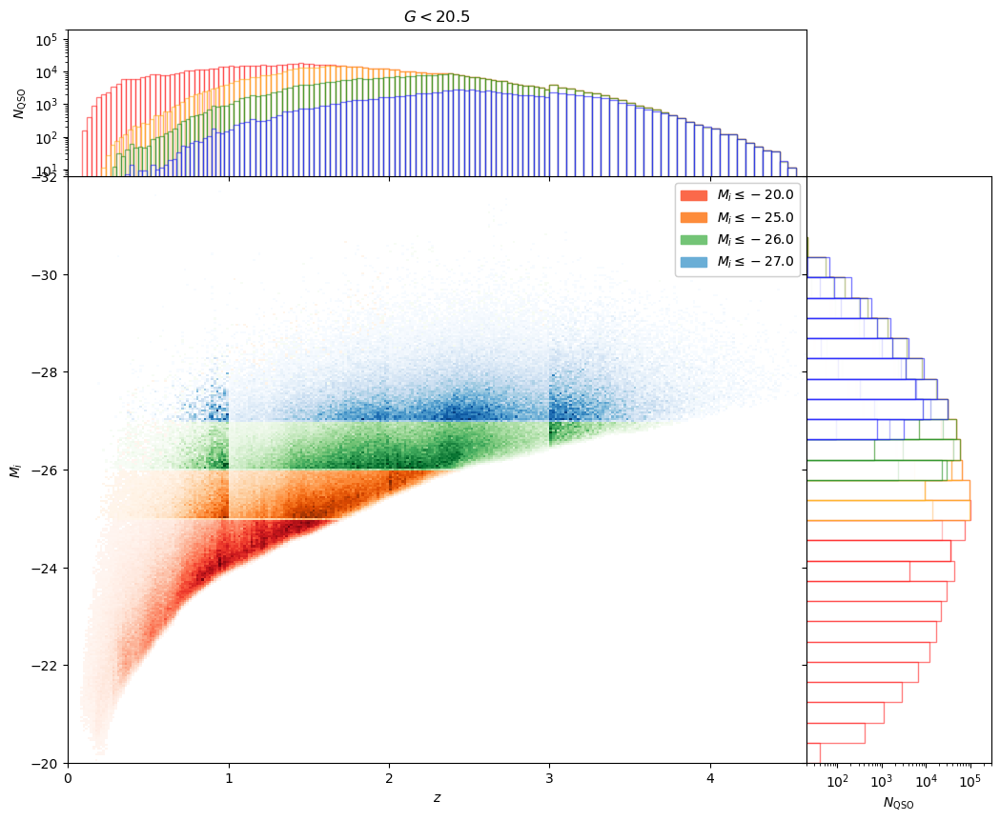

In [27]:
# plot!
fig = plt.figure(figsize = (12.5, 10))
gs = gridspec.GridSpec(2, 2, hspace = 0, height_ratios=[1,4], width_ratios=[4,1], wspace = 0)
fac_rand = 25

ax1 = fig.add_subplot(gs[2])
ax2 = fig.add_subplot(gs[0])
ax3 = fig.add_subplot(gs[3])

N_q = {L: [] for L in L_bins}

for i in range(len(L_bins)):
        
    for j in z_array:
        
        tab_datahi_mask_zbin0, tab_randhi_mask_zbin0, key_zbin0, _, _, _, _, _, _ = quaia.make_bins(G_hi, [j, i], True, ['z', 'L'], 
                                                                                             bins = [z_bins, L_bins], tab_gcat_type = 'data', 
                                                                                              method = ['minmax', 'max'], fac_rand = fac_rand, 
                                                                                              mask = mask*100, percentile = True, n_bins = [None, None])
        quaia.absolute(tab_datahi_mask_zbin0, G_hi)
        h1, xedges, yedges, image = ax1.hist2d(tab_datahi_mask_zbin0['redshift_quaia'], tab_datahi_mask_zbin0['M_i'],
                                               cmap = plt.get_cmap('{}s'.format(colors[i])), bins = [np.linspace(0, 4.6, 300), np.linspace(-32, -20, 300)],
                                               cmin = 1)
        xlim = ax1.get_xlim()

        ax2.hist(tab_datahi_mask_zbin0['redshift_quaia'], color = 'white', edgecolor = colors[i], bins = 30, alpha = 0.5)
        ax3.hist(tab_datahi_mask_zbin0['M_i'], color = 'white', edgecolor = colors[i], orientation = 'horizontal', bins = np.linspace(-32, -20, 30), alpha = 0.5, label = '$M_i\leq{}$'.format(L_bins[i]))
        
        N_q[L_bins[i]].append(len(tab_datahi_mask_zbin0))
    
ax1.set_ylabel('$M_i$')
ax1.set_xlabel('$z$')
ax1.set_ylim(-20, -32)

ax2.set_ylabel('$N_\mathrm{QSO}$')
ax2.set_yscale('log')
ax2.set_xlim(xlim)
ax2.set_ylim(6,2e5)
ax2.set_xticklabels([])
ax2.set_title('$G<{}$'.format(G_hi))

ax3.set_xlabel('$N_\mathrm{QSO}$')
ax3.set_xscale('log')
ax3.set_yticklabels([])
ax3.set_ylim(-20, -32)
ax3.set_xlim(2e1,3e5)

custom_lines = [mpatches.Patch(color=plt.get_cmap('{}s'.format(colors[i]))(np.array(0.5))) for i in range(len(L_bins))]
second_legend = ax1.legend(custom_lines, ['$M_i\leq{}$'.format(L) for L in L_bins])
fig.add_artist(second_legend)

plt.show()

In [28]:
fac_rand = 25

N_cut = []

for i in range(len(L_bins)):

    N_z = []
    for j in z_array:

        try:
            
            tab_datahi_mask_zbin0, tab_randhi_mask_zbin0, key_zbin0, _, _, _, _, _, _ = quaia.make_bins(G_hi, [j, i], True, ['z', 'L'], 
                                                                                             bins = [z_bins, L_array[::-1]], tab_gcat_type = 'data', 
                                                                                              method = ['minmax', 'minmax'], fac_rand = fac_rand, 
                                                                                              mask = mask*100, percentile = True, n_bins = [None, None])
            quaia.absolute(tab_datahi_mask_zbin0, G_hi)        
            N_z.append(len(tab_datahi_mask_zbin0))

        except:
            print('G{}_zmin{}zmax{}_Lmin{}Lmax{}:                   no selection function'.format(G_hi, z_bins[j], z_bins[j+1], L_array[::-1][i], 
                                                                                                      L_array[::-1][i+1]))
    N_cut.append(N_z)
    
plt.show()

0.6709454064119132
Pixels masked by MC but not already by selfunc: 40
G20.5_zmin0.0zmax1.0_Lmin-32.0Lmax-27.0: 0.34              1226 vs 1860
0.4024413828706144
Pixels masked by MC but not already by selfunc: 353
G20.5_zmin1.0zmax2.0_Lmin-32.0Lmax-27.0: 0.36              24196 vs 38015
0.7780317247297315
Pixels masked by MC but not already by selfunc: 994
G20.5_zmin2.0zmax3.0_Lmin-32.0Lmax-27.0: 0.35              66160 vs 102196
0.9271432229928644
Pixels masked by MC but not already by selfunc: 222
G20.5_zmin3.0zmax4.6_Lmin-32.0Lmax-27.0: 0.26              21464 vs 28856
0.7859569126372322
Pixels masked by MC but not already by selfunc: 79
G20.5_zmin0.0zmax1.0_Lmin-27.0Lmax-26.0: 0.35              6731 vs 10412
0.6665366114860157
Pixels masked by MC but not already by selfunc: 1364
G20.5_zmin1.0zmax2.0_Lmin-27.0Lmax-26.0: 0.35              93381 vs 144714
0.6778795939336029
Pixels masked by MC but not already by selfunc: 1834
G20.5_zmin2.0zmax3.0_Lmin-27.0Lmax-26.0: 0.20              1

In [29]:
tab_datahi_mask_zbin0, tab_randhi_mask_zbin0, key_zbin0, _, _, _, _, _, _ = quaia.make_bins(G_hi, 0, True, 'z', 
                                                                                             bins = [0,4.6], tab_gcat_type = 'data', fac_rand = fac_rand, 
                                                                                              mask = mask*100, percentile = True, n_bins = None)

Leaving tab_gcat_catalog unbinned
0.7218404375029477
Pixels masked by MC but not already by selfunc: 9651
G20.5: 0.28              931348 vs 1295502


In [30]:
quaia.absolute(tab_datahi_mask_zbin0, G_hi)

array([13373.67101789, 12661.44392965,  2318.42771168, ...,
       13102.99125304,  7229.02591058, 12840.07529872])

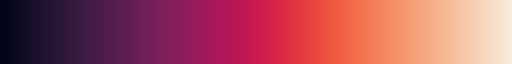

In [31]:
cmap_rocket = sns.color_palette("rocket", as_cmap=True)
cmap_rocket

<>:34: SyntaxWarning: invalid escape sequence '\m'
<>:42: SyntaxWarning: invalid escape sequence '\m'
<>:34: SyntaxWarning: invalid escape sequence '\m'
<>:42: SyntaxWarning: invalid escape sequence '\m'
/tmp/ipykernel_27473/2902669050.py:34: SyntaxWarning: invalid escape sequence '\m'
  ax2_hi.set_ylabel('$N_\mathrm{QSO}$')
/tmp/ipykernel_27473/2902669050.py:42: SyntaxWarning: invalid escape sequence '\m'
  ax3_hi.set_xlabel('$N_\mathrm{QSO}$')


G20.5_zmin2.0zmax3.0_Lmin-25.0Lmax-20.0:                   no selection function
G20.5_zmin3.0zmax4.6_Lmin-26.0Lmax-25.0:                   no selection function
G20.5_zmin3.0zmax4.6_Lmin-25.0Lmax-20.0:                   no selection function


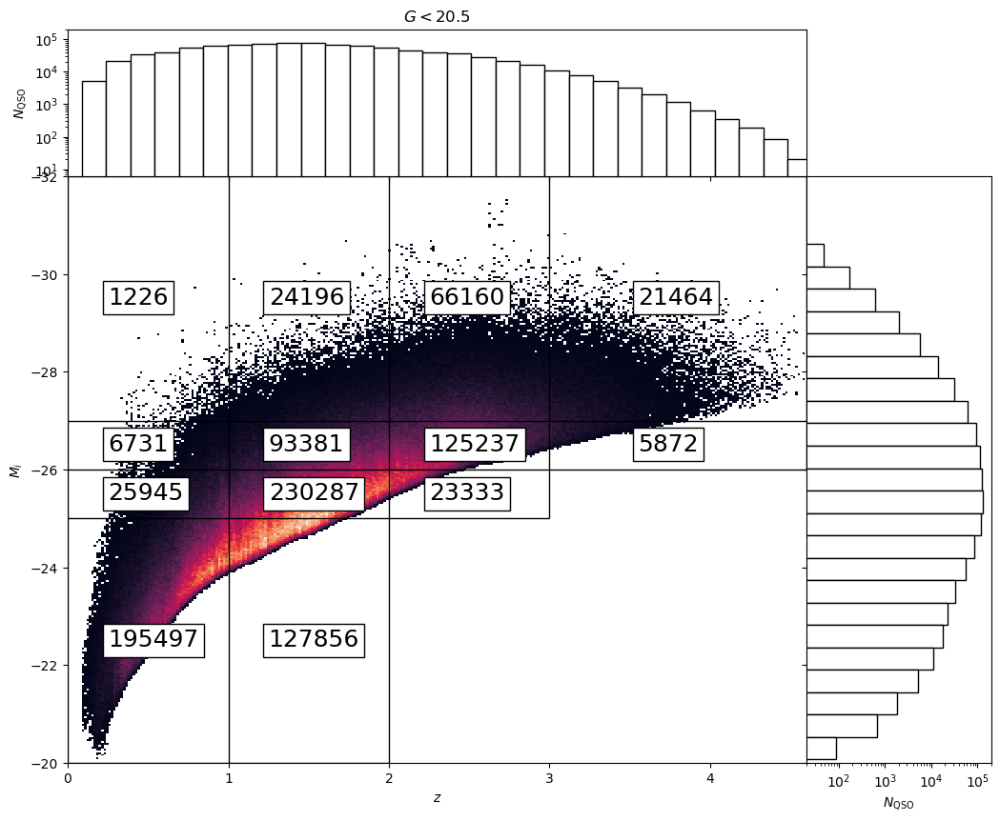

In [32]:
# plot!
fig = plt.figure(figsize = (12.5, 10))
gs = gridspec.GridSpec(2, 2, hspace = 0, height_ratios=[1,4], width_ratios=[4,1], wspace = 0)

ax1_hi = fig.add_subplot(gs[2])

h1, xedges, yedges, image = ax1_hi.hist2d(tab_datahi_mask_zbin0['redshift_quaia'], tab_datahi_mask_zbin0['M_i'], cmap = cmap_rocket, bins = 300, 
                                       cmin = 1)

for L_bin, xmax in zip(L_array, [z_bins[2], z_bins[3], z_bins[4], z_bins[4], z_bins[4]]):
    ax1_hi.hlines(L_bin, color = 'black', xmin = z_bins[0], xmax = xmax, linewidth = 1)
for z_bin, ymax in zip(z_bins, [L_bins[0], L_bins[0], L_bins[0], L_bins[1], L_bins[2]]):
    ax1_hi.vlines(z_bin, color = 'black', ymin = -32, ymax = ymax, linewidth = 1)
    
for i in z_array:
    for j in range(len(L_bins)):
        
        try:
            if N_cut[j][i]>1000:
                ax1_hi.text(quaia.recenter(z_bins)[i]-0.25, quaia.recenter(L_array[::-1])[j]+0.125, N_cut[j][i], fontsize = 18, color = 'black', bbox=dict(facecolor='white'))
        except:
            print('G{}_zmin{}zmax{}_Lmin{}Lmax{}:                   no selection function'.format(G_hi, z_bins[i], z_bins[i+1], L_array[::-1][j], 
                                                                                                      L_array[::-1][j+1]))
            
ax1_hi.set_ylabel('$M_i$')
xlim = ax1.get_xlim()
ax1_hi.set_xlabel('$z$')
ax1_hi.set_ylim(-20, -32)
ax1_hi.set_xlim(xlim[0], z_bins[-1])

ax2_hi = fig.add_subplot(gs[0])
ax2_hi.hist(tab_datahi_mask_zbin0['redshift_quaia'], color = 'white', edgecolor = 'black', bins = 30)
ax2_hi.set_title('$G<{}$'.format(G_hi))
ax2_hi.set_ylabel('$N_\mathrm{QSO}$')
ax2_hi.set_yscale('log')
ax2_hi.set_xlim(xlim[0], z_bins[-1])
ax2_hi.set_ylim(6,2e5)
ax2_hi.set_xticklabels([])

ax3_hi = fig.add_subplot(gs[3])
ax3_hi.hist(tab_datahi_mask_zbin0['M_i'], color = 'white', edgecolor = 'black', orientation = 'horizontal', bins = 25)
ax3_hi.set_xlabel('$N_\mathrm{QSO}$')
ax3_hi.set_xscale('log')
ax3_hi.set_yticklabels([])
ax3_hi.set_ylim(-20, -32)
ax3_hi.set_xlim(2e1,2e5)

# plt.savefig('../figures/cut.pdf', bbox_inches = 'tight')
plt.show()

<>:29: SyntaxWarning: invalid escape sequence '\m'
<>:37: SyntaxWarning: invalid escape sequence '\m'
<>:29: SyntaxWarning: invalid escape sequence '\m'
<>:37: SyntaxWarning: invalid escape sequence '\m'
/tmp/ipykernel_27473/1536455728.py:29: SyntaxWarning: invalid escape sequence '\m'
  ax2_hi.set_ylabel('$N_\mathrm{QSO}$')
/tmp/ipykernel_27473/1536455728.py:37: SyntaxWarning: invalid escape sequence '\m'
  ax3_hi.set_xlabel('$N_\mathrm{QSO}$')


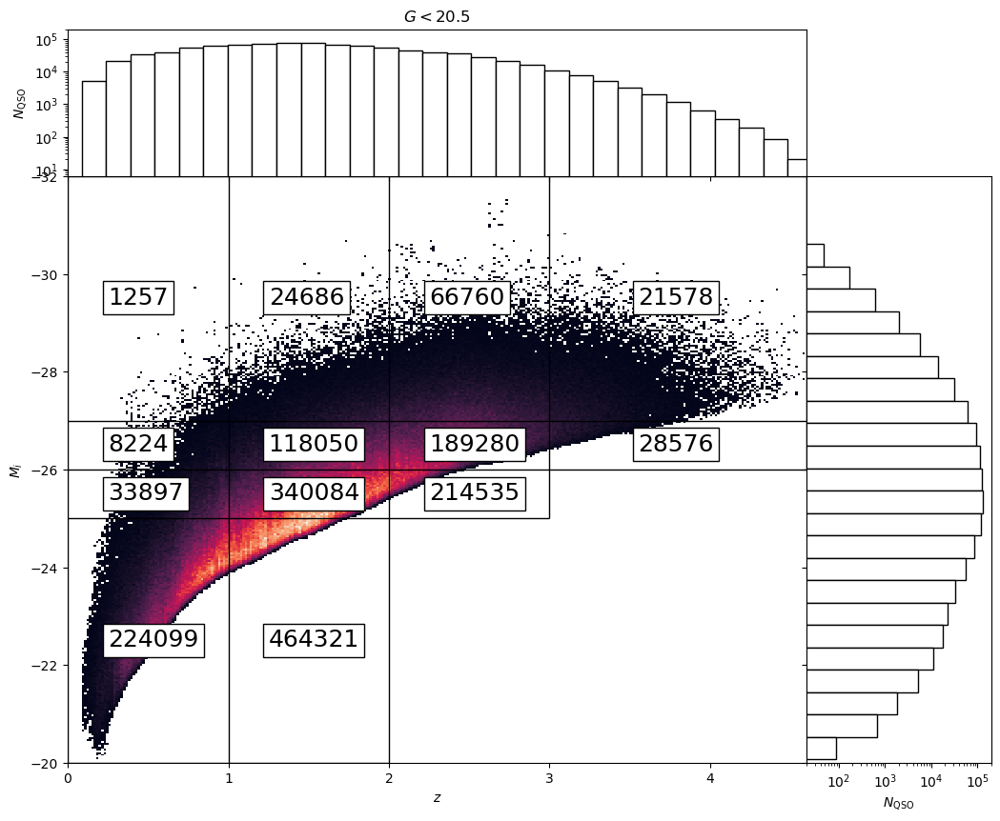

In [33]:
# plot!
fig = plt.figure(figsize = (12.5, 10))
gs = gridspec.GridSpec(2, 2, hspace = 0, height_ratios=[1,4], width_ratios=[4,1], wspace = 0)

ax1_hi = fig.add_subplot(gs[2])

h1, xedges, yedges, image = ax1_hi.hist2d(tab_datahi_mask_zbin0['redshift_quaia'], tab_datahi_mask_zbin0['M_i'], cmap = cmap_rocket, bins = 300, 
                                       cmin = 1)

for L_bin, xmax in zip(L_array, [z_bins[2], z_bins[3], z_bins[4], z_bins[4], z_bins[4]]):
    ax1_hi.hlines(L_bin, color = 'black', xmin = z_bins[0], xmax = xmax, linewidth = 1)
for z_bin, ymax in zip(z_bins, [L_bins[0], L_bins[0], L_bins[0], L_bins[1], L_bins[2]]):
    ax1_hi.vlines(z_bin, color = 'black', ymin = -32, ymax = ymax, linewidth = 1)
    
for i in z_array:
    for j in range(len(L_bins)):
        if ((j<3) and (N_q[L_bins[j]][i]>N_q[L_bins[j+1]][i])) or (j ==3):
            ax1_hi.text(quaia.recenter(z_bins)[i]-0.25, quaia.recenter(L_array)[j]+0.125, N_q[L_bins[j]][i], fontsize = 18, color = 'black', bbox=dict(facecolor='white'))
            
ax1_hi.set_ylabel('$M_i$')
xlim = ax1.get_xlim()
ax1_hi.set_xlabel('$z$')
ax1_hi.set_ylim(-20, -32)
ax1_hi.set_xlim(xlim[0], z_bins[-1])

ax2_hi = fig.add_subplot(gs[0])
ax2_hi.hist(tab_datahi_mask_zbin0['redshift_quaia'], color = 'white', edgecolor = 'black', bins = 30)
ax2_hi.set_title('$G<{}$'.format(G_hi))
ax2_hi.set_ylabel('$N_\mathrm{QSO}$')
ax2_hi.set_yscale('log')
ax2_hi.set_xlim(xlim[0], z_bins[-1])
ax2_hi.set_ylim(6,2e5)
ax2_hi.set_xticklabels([])

ax3_hi = fig.add_subplot(gs[3])
ax3_hi.hist(tab_datahi_mask_zbin0['M_i'], color = 'white', edgecolor = 'black', orientation = 'horizontal', bins = 25)
ax3_hi.set_xlabel('$N_\mathrm{QSO}$')
ax3_hi.set_xscale('log')
ax3_hi.set_yticklabels([])
ax3_hi.set_ylim(-20, -32)
ax3_hi.set_xlim(2e1,2e5)

# plt.savefig('../figures/threshold.pdf', bbox_inches = 'tight')
plt.show()

# Implement halo model
## Plot HOD: $\langle N\left(M\right)\rangle=\frac{f_{\text {duty }}}{2} \operatorname{erfc}\left[\frac{\ln (M_\mathrm{min} / M)}{\sqrt{2} \log{10} \Sigma}\right]$
### At fixed $f_{duty}$ and $M_{min}$

In [47]:
n_bins = 79 #159

In [48]:
bins = np.logspace(9, M_max, n_bins)

# Calculate derived parameters
## Limit scales to $30\geq s \geq 80h^{-1}$ Mpc

In [34]:
# Create the bins array
rmin = 30 #-delta_min*offset # 0.1 # start higher # 1.4 # 30
rmax = 180 #80 #+delta_max*offset # 200
nbins = 30 #10 20 + int(delta_min+delta_max) #90 #20
rbins_chi2 = np.linspace(rmin, rmax, nbins + 1) # Mpc/h https://github.com/manodeep/Corrfunc/issues/202
scale = 'linear'
rbins_chi2, quaia.recenter(rbins_chi2), np.diff(quaia.recenter(rbins_chi2))

(array([ 30.,  35.,  40.,  45.,  50.,  55.,  60.,  65.,  70.,  75.,  80.,
         85.,  90.,  95., 100., 105., 110., 115., 120., 125., 130., 135.,
        140., 145., 150., 155., 160., 165., 170., 175., 180.]),
 array([ 32.5,  37.5,  42.5,  47.5,  52.5,  57.5,  62.5,  67.5,  72.5,
         77.5,  82.5,  87.5,  92.5,  97.5, 102.5, 107.5, 112.5, 117.5,
        122.5, 127.5, 132.5, 137.5, 142.5, 147.5, 152.5, 157.5, 162.5,
        167.5, 172.5, 177.5]),
 array([5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5.,
        5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5.]))

In [35]:
pimax = 80 # 40 # 5000.0 # 40.0\
dpi = 0.01
pibins = np.arange(0, pimax+1, dpi)

## Pick cosmology

In [36]:
cosmo = 'Planck'

In [37]:
N = 50 #20 #65 #50 #30 #15 #80

## Plot correlation matrix

<>:23: SyntaxWarning: invalid escape sequence '\l'
<>:26: SyntaxWarning: invalid escape sequence '\l'
<>:23: SyntaxWarning: invalid escape sequence '\l'
<>:26: SyntaxWarning: invalid escape sequence '\l'
/tmp/ipykernel_27473/2391003.py:23: SyntaxWarning: invalid escape sequence '\l'
  ax1.set_ylabel('$r_{{p,{:.1f}<z \leq{:.1f}}} (h^{{-1}}$ Mpc)'.format(z_bins[i], z_bins[i+1]))
/tmp/ipykernel_27473/2391003.py:26: SyntaxWarning: invalid escape sequence '\l'
  ax1.set_title('$M_i\leq{}$'.format(L_bins[j]))


(-1.0, 1.0)
(-1.0, 1.0)
(-1.0, 1.0)
(-1.0, 1.0)
(-1.0, 1.0)
(-1.0, 1.0)
(-1.0, 1.0)
(-1.0, 1.0)
(-1.0, 1.0)
(-1.0, 1.0)
(-1.0, 1.0)
(-1.0, 1.0)
(-1.0, 1.0)
(-1.0, 1.0)
(-1.0, 1.0)
(-1.0, 1.0)


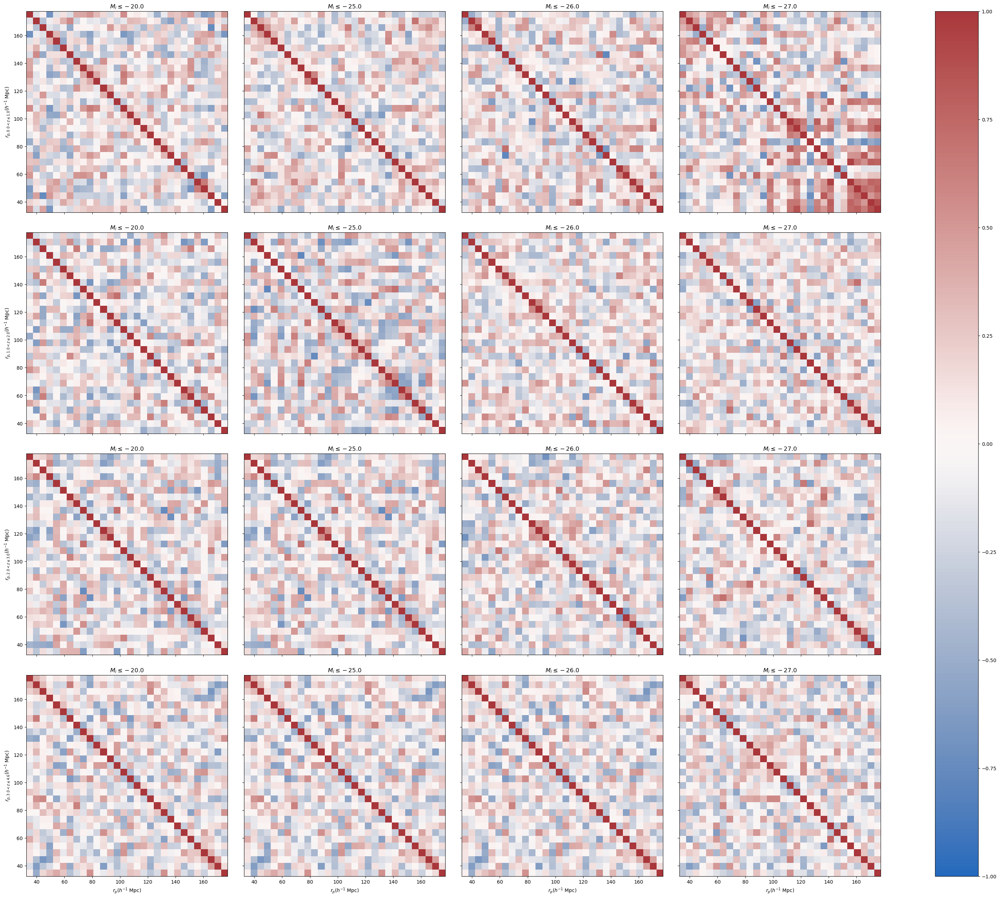

In [38]:
cmap = sns.color_palette("vlag", as_cmap=True)
r = quaia.recenter(rbins_chi2) #_chi2)

# plot!
fig = plt.figure(figsize = (40, 32))
gs = gridspec.GridSpec(4, 4, wspace = 0, hspace = 0.1)
axes = []
for i in range(len(z_bins)-1):
    
    for j in range(len(L_bins)):
    
        ax1 = fig.add_subplot(gs[i*4+j])

        C = np.load('../results/cov_wp_G{}_rmin{}_rmax{}_nbins{}_pimax{}_zmin{}zmax{}_Lmax{}_N{}_{}_MC_mask.npy'.format(G_hi, rmin, rmax, nbins, pimax, z_bins[i], z_bins[i+1], L_bins[j], N, cosmo))
        matrix = np.corrcoef(C)
        image = ax1.imshow(matrix, cmap = cmap, extent = [r[0], r[-1], r[0], r[-1]], vmin = -1, vmax = 1)
        print(image.get_clim())
        if i > 2:
            ax1.set_xlabel('$r_p (h^{-1}$ Mpc)')
        else:
            ax1.set_xticklabels([])
        if j == 0:
            ax1.set_ylabel('$r_{{p,{:.1f}<z \leq{:.1f}}} (h^{{-1}}$ Mpc)'.format(z_bins[i], z_bins[i+1]))
        else:
            ax1.set_yticklabels([])
        ax1.set_title('$M_i\leq{}$'.format(L_bins[j]))
        axes.append(ax1)
    
fig.colorbar(image, ax = axes)
plt.show()

### Test the mask

In [39]:
masks = [0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8]
cmap_masks = sns.color_palette("coolwarm", n_colors = len(masks))
cmap_masks

[(0.383662065772549, 0.5101834172862746, 0.9178306732313726),
 (0.5543118699137254, 0.6900970112156862, 0.9955155482352941),
 (0.724041371882353, 0.8149103926470588, 0.9756509706470589),
 (0.8674276350862745, 0.864376599772549, 0.8626024620196079),
 (0.9595176584705882, 0.7669728545098039, 0.6741447150392157),
 (0.9566532109764706, 0.598033822717647, 0.4773022923529412),
 (0.8653913329372549, 0.3711276720470588, 0.2957689564156863)]

<>:21: SyntaxWarning: invalid escape sequence '\l'
<>:91: SyntaxWarning: invalid escape sequence '\m'
<>:21: SyntaxWarning: invalid escape sequence '\l'
<>:91: SyntaxWarning: invalid escape sequence '\m'
/tmp/ipykernel_27473/3817971649.py:21: SyntaxWarning: invalid escape sequence '\l'
  ax1.set_title('$M_i\leq{}$'.format(L_bins[i]))
/tmp/ipykernel_27473/3817971649.py:91: SyntaxWarning: invalid escape sequence '\m'
  ax1.errorbar(rpavg_zbin_i, wp_zbin_i, marker = 'o', label = '${:.0f}^\mathrm{{th}}$ percentile'.format(mask*100), markeredgewidth = 2.5, capsize = 2.5,


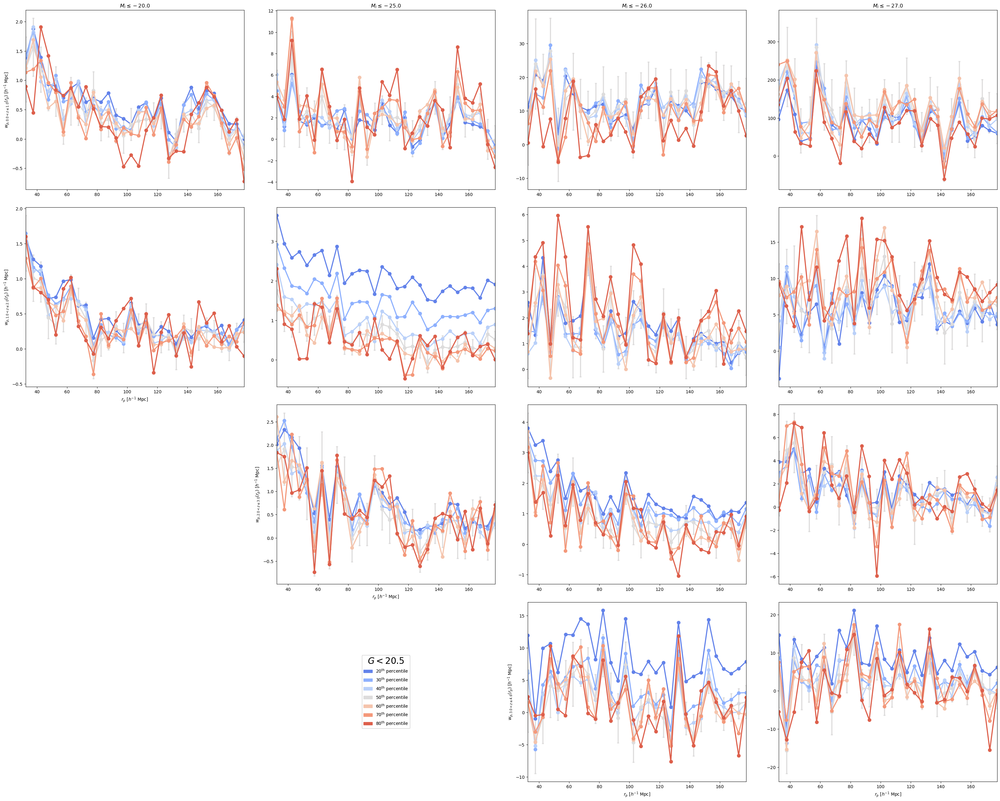

In [40]:
r = quaia.recenter(rbins_chi2) #_chi2)
wp_chi2, wp_matter_chi2, rpavg_chi2 = {L: [] for L in L_bins}, {L: [] for L in L_bins}, {L: [] for L in L_bins}
a_zbin = {L: [] for L in L_bins}

fig = plt.figure(figsize = (40, 32))
gs = gridspec.GridSpec(4, 4, wspace = 0.15, hspace = 0.1)

H0 = Planck18.H0 # cosmo_planck18['H0'] * u.km/u.s/u.Mpc

for j in z_array:
    
    for i in range(len(L_bins)):

        # if ((j<3) and (N_q[L_bins[j]][i]>N_q[L_bins[j+1]][i])) or (j==3):

        if ((i<3) and (N_q[L_bins[i]][j]>N_q[L_bins[i+1]][j])) or (i==3):
                
            ax1 = fig.add_subplot(gs[j*4+i])

            if j ==0:
                ax1.set_title('$M_i\leq{}$'.format(L_bins[i]))
            if scale == 'log':
                ax1.set_xscale('log')
            ax1.set_xlim(r[0], r[-1])

            # if i*4+j == 1:
            #     ax1.set_ylim(-0.5, 1.75)
            # elif i*4+j == 2:
            #     ax1.set_ylim(-1, 2.75)
            # elif i*4+j == 3:
            #     ax1.set_ylim(-7.5, 17.5)
            
            if j > 2 or ((j>0) and (i <2) and (i!=j)):
                ax1.set_xlabel(r'$r_p$ $[h^{-1}$ Mpc]') # projected
            if i==0 or ((j>1) and (i <3) and (i!=j)):
                ax1.set_ylabel(r"$w_{{p,{:.1f}<z \leq{:.1f}}}(r_p)$ $[h^{{-1}}$ Mpc]".format(z_bins[j], z_bins[j+1]))
        else:

            ax2 = fig.add_subplot(gs[j*4+i])
            ax2.set_axis_off()
                
        for k in range(len(masks)):
                    
            try:
                
                wp_zbin_i = np.load('../results/wp_G{}_rmin{}_rmax{}_nbins{}_pimax{}_zmin{}zmax{}_Lmax{}_{}_MC_mask{}.npy'.format(G_hi, rmin, rmax, nbins, pimax, z_bins[j], z_bins[j+1], L_bins[i], cosmo, masks[k]))
                rpavg_zbin_i = np.load('../results/rpavg_G{}_rmin{}_rmax{}_nbins{}_pimax{}_zmin{}zmax{}_Lmax{}_{}_MC_mask{}.npy'.format(G_hi, rmin, rmax, nbins, pimax, z_bins[j], z_bins[j+1], L_bins[i], cosmo, masks[k]))
                a = float(np.load('../results/a_G{}_zmin{}zmax{}_Lmax{}_{}_MC_mask{}.npy'.format(G_hi, z_bins[j], z_bins[j+1], L_bins[i], cosmo, masks[k])))

            except:

                tab_datahi_mask_zbin0, tab_randhi_mask_zbin0, key_zbin0, _, _, _, _, _, selfunc_hi_bin0, = quaia.make_bins(G_hi, [j, i], True, ['z', 'L'], 
                                                                                             bins = [z_bins, L_bins], tab_gcat_type = 'data', 
                                                                                              method = ['minmax', 'max'], fac_rand = fac_rand, 
                                                                                              mask = masks[k]*100, percentile = True, n_bins = [None, None])
                
                # quasar correlation function
                wp_zbin_i, rpavg_zbin_i = quaia.wp_rp(tab_datahi_mask_zbin0, tab_randhi_mask_zbin0, key_zbin0, nthreads = nthreads, 
                                                                              rbins = rbins_chi2, nbins = nbins, pimax = pimax, Om0 = Planck18.Om0, h = Planck18.h)

                # scale factor
                a = a_median(tab_datahi_mask_zbin0)
                
                np.save('../results/wp_G{}_rmin{}_rmax{}_nbins{}_pimax{}_zmin{}zmax{}_Lmax{}_{}_MC_mask{}'.format(G_hi, rmin, rmax, nbins, pimax, z_bins[j], z_bins[j+1], L_bins[i], cosmo, masks[k]), wp_zbin_i)
                np.save('../results/rpavg_G{}_rmin{}_rmax{}_nbins{}_pimax{}_zmin{}zmax{}_Lmax{}_{}_MC_mask{}'.format(G_hi, rmin, rmax, nbins, pimax, z_bins[j], z_bins[j+1], L_bins[i], cosmo, masks[k]), rpavg_zbin_i)
                np.save('../results/a_G{}_zmin{}zmax{}_Lmax{}_{}_MC_mask{}'.format(G_hi, z_bins[j], z_bins[j+1], L_bins[i], cosmo, masks[k]), a)
            
            if masks[k] == 0.5:
                
                sigma = np.sqrt(np.diag(np.load('../results/cov_wp_G{}_rmin{}_rmax{}_nbins{}_pimax{}_zmin{}zmax{}_Lmax{}_N{}_{}_MC_mask.npy'.format(G_hi, rmin, rmax, nbins, pimax, z_bins[j], z_bins[j+1], L_bins[i], N, cosmo))))

                wp_chi2[L_bins[i]].append(wp_zbin_i)
                rpavg_chi2[L_bins[i]].append(rpavg_zbin_i)
                a_zbin[L_bins[i]].append(a)

                # matter correlation function   
                s = np.sqrt(np.sum(np.meshgrid(np.array(rpavg_zbin_i)**2, quaia.recenter(pibins)**2), axis = 0))
                s_Mpc = (s*u.Mpc/cu.littleh).to(u.Mpc, cu.with_H0(H0))

                xirppi_zbin_i = ccl.correlations.correlation_3d(cosmo_planck18, r=np.ravel(s_Mpc), a=a)
                wp_matter_zbin_i = 2*np.trapz(np.reshape(xirppi_zbin_i, np.shape(s_Mpc)), quaia.recenter(pibins), axis = 0)
                wp_matter_chi2[L_bins[i]].append(wp_matter_zbin_i)   
            
            else: 
                sigma = 0

            # plot!

            if ((i<3) and (N_q[L_bins[i]][j]>N_q[L_bins[i+1]][j])) or (i==3):
                    
                ax1.errorbar(rpavg_zbin_i, wp_zbin_i, marker = 'o', label = '${:.0f}^\mathrm{{th}}$ percentile'.format(mask*100), markeredgewidth = 2.5, capsize = 2.5,
                         linewidth = 2.5, color = cmap_masks[k], yerr = sigma, linestyle = '-')

                
custom_lines = [mpatches.Patch(color=cmap_masks[i]) for i in range(len(masks))]
first_legend = ax2.legend(custom_lines, [r'${:.0f}^\mathrm{{th}}$ percentile'.format(mask*100) for mask in masks], loc = 'center', title = r'$G<{}$'.format(G_hi), title_fontsize = 20)
fig.add_artist(first_legend)

plt.show()

<>:13: SyntaxWarning: invalid escape sequence '\l'
<>:30: SyntaxWarning: invalid escape sequence '\m'
<>:13: SyntaxWarning: invalid escape sequence '\l'
<>:30: SyntaxWarning: invalid escape sequence '\m'
/tmp/ipykernel_20596/2699197698.py:13: SyntaxWarning: invalid escape sequence '\l'
  ax1.set_title('$M_i\leq{}$'.format(L_bins[i]))
/tmp/ipykernel_20596/2699197698.py:30: SyntaxWarning: invalid escape sequence '\m'
  ax1.errorbar(rpavg_zbin_i, wp_zbin_i, marker = 'o', label = '${:.0f}^\mathrm{{th}}$ percentile'.format(mask*100), markeredgewidth = 2.5, capsize = 2.5,


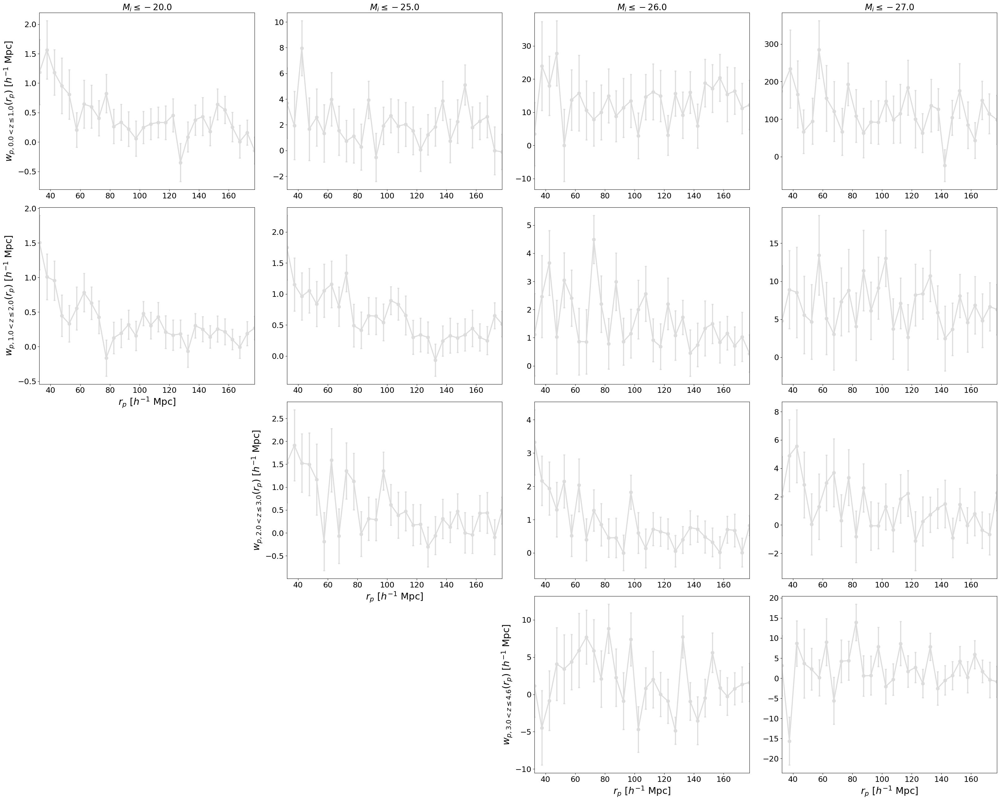

In [70]:
fig = plt.figure(figsize = (40, 32))
gs = gridspec.GridSpec(4, 4, wspace = 0.15, hspace = 0.1)
k = 3
for j in z_array:
    
    for i in range(len(L_bins)):

        if ((i<3) and (N_q[L_bins[i]][j]>N_q[L_bins[i+1]][j])) or (i==3):
                
            ax1 = fig.add_subplot(gs[j*4+i])

            if j ==0:
                ax1.set_title('$M_i\leq{}$'.format(L_bins[i]))
            if scale == 'log':
                ax1.set_xscale('log')
            ax1.set_xlim(r[0], r[-1])
            
            if j > 2 or ((j>0) and (i <2) and (i!=j)):
                ax1.set_xlabel(r'$r_p$ $[h^{-1}$ Mpc]') # projected
            if i==0 or ((j>1) and (i <3) and (i!=j)):
                ax1.set_ylabel(r"$w_{{p,{:.1f}<z \leq{:.1f}}}(r_p)$ $[h^{{-1}}$ Mpc]".format(z_bins[j], z_bins[j+1]))
                            
            wp_zbin_i = np.load('../results/wp_G{}_rmin{}_rmax{}_nbins{}_pimax{}_zmin{}zmax{}_Lmax{}_{}_MC_mask{}.npy'.format(G_hi, rmin, rmax, nbins, pimax, z_bins[j], z_bins[j+1], L_bins[i], cosmo, masks[k]))
            rpavg_zbin_i = np.load('../results/rpavg_G{}_rmin{}_rmax{}_nbins{}_pimax{}_zmin{}zmax{}_Lmax{}_{}_MC_mask{}.npy'.format(G_hi, rmin, rmax, nbins, pimax, z_bins[j], z_bins[j+1], L_bins[i], cosmo, masks[k]))
            a = float(np.load('../results/a_G{}_zmin{}zmax{}_Lmax{}_{}_MC_mask{}.npy'.format(G_hi, z_bins[j], z_bins[j+1], L_bins[i], cosmo, masks[k])))            
            sigma = np.sqrt(np.diag(np.load('../results/cov_wp_G{}_rmin{}_rmax{}_nbins{}_pimax{}_zmin{}zmax{}_Lmax{}_N{}_{}_MC_mask.npy'.format(G_hi, rmin, rmax, nbins, pimax, z_bins[j], z_bins[j+1], L_bins[i], N, cosmo))))
                
            # plot!
                        
            ax1.errorbar(rpavg_zbin_i, wp_zbin_i, marker = 'o', label = '${:.0f}^\mathrm{{th}}$ percentile'.format(mask*100), markeredgewidth = 2.5, capsize = 2.5,
                     linewidth = 2.5, color = cmap_masks[k], yerr = sigma, linestyle = '-')

plt.show()

### Test $M_{min}$

In [41]:
def wp_2h(bins, n_m, a, cosmo, wp_matter_zbin_i, rpbins = rbins_chi2, pibins = pibins, recenter = True, rpmask = True):

    if not isinstance(wp_matter_zbin_i, np.ndarray):
        
        print('computing wp_matter')
        
        # matter correlation function    
        if isinstance(rpmask, bool):
            rpmask = [rpmask]*len(quaia.recenter(rpbins))
            
        s = np.sqrt(np.sum(np.meshgrid(quaia.recenter(rpbins)[rpmask]**2, quaia.recenter(pibins)**2), axis = 0))
        s_Mpc = (s*u.Mpc/cu.littleh).to(u.Mpc, cu.with_H0(cosmo['h']* 100 * u.km/u.s/u.Mpc))

        xirppi_zbin_i = ccl.correlations.correlation_3d(cosmo, r=np.ravel(s_Mpc), a=a)
        wp_matter_zbin_i = 2*np.trapz(np.reshape(xirppi_zbin_i, np.shape(s_Mpc)), quaia.recenter(pibins), axis = 0)

    return cf_2h(bins, n_m, a, cosmo, wp_matter_zbin_i, recenter = recenter)

In [42]:
Mmins = [11,12,13,14,15,16]

In [43]:
cmap_green = plt.get_cmap('Greens')(np.linspace(0.333, 0.999, len(Mmins)))

<>:51: SyntaxWarning: invalid escape sequence '\l'
<>:51: SyntaxWarning: invalid escape sequence '\l'
/tmp/ipykernel_27473/3135391923.py:51: SyntaxWarning: invalid escape sequence '\l'
  ax1.set_title('$M_i\leq{}$'.format(L_bins[i]))


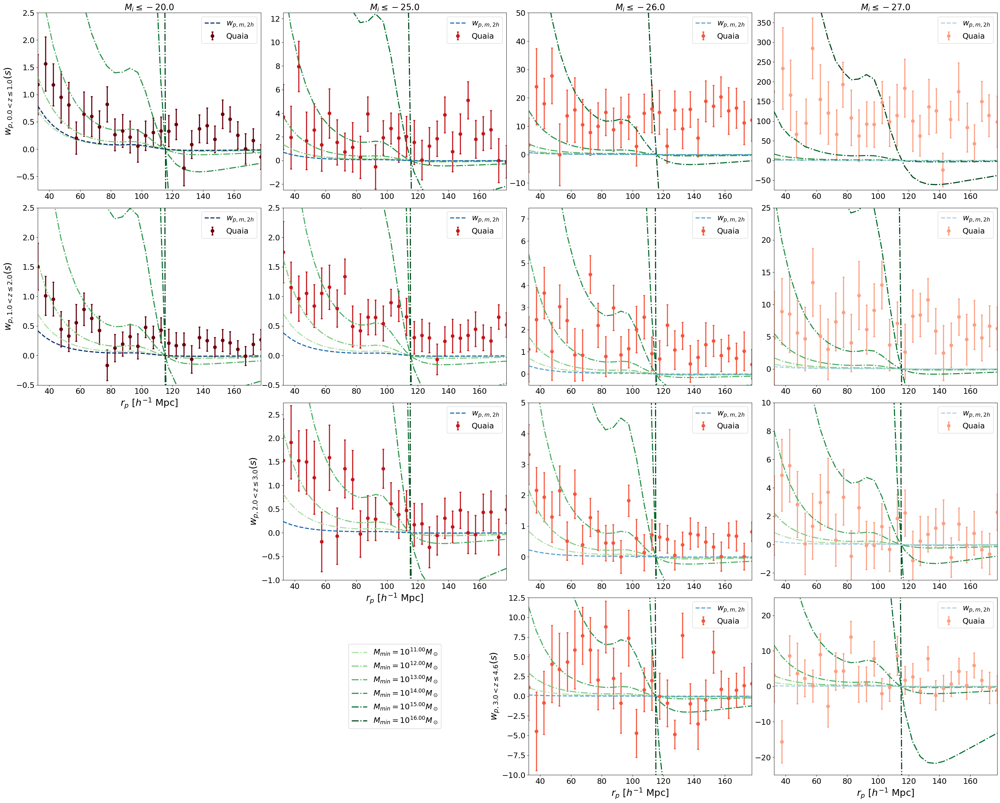

In [49]:
# remove bottom panel and just print bq somewhere
# plot!
fig = plt.figure(figsize = (40, 32))
gs = gridspec.GridSpec(4, 4, wspace = 0.1, hspace = 0.1)
ylims = [[-0.75, 2.5], [-2.5, 12.5], [-12.5, 50], [-75, 375]], [[-0.5, 2.5], [-0.5, 2.5], [-0.5, 7.5], [-2.5, 25]], [[np.nan, np.nan], [-1, 2.75], [-0.75, 5], [-2.5, 10]], [[np.nan, np.nan], [np.nan, np.nan], [-10, 12.5], [-25, 25]]
m = 0
for j in range(len(z_array)):
    
    for i in range(len(L_bins)):

        if ((i<3) and (N_q[L_bins[i]][j]>N_q[L_bins[i+1]][j])) or (i==3):

            ax1 = fig.add_subplot(gs[j*4+i])

            C = np.load('../results/cov_wp_G{}_rmin{}_rmax{}_nbins{}_pimax{}_zmin{}zmax{}_Lmax{}_N{}_{}_MC_mask.npy'.format(G_hi, rmin, rmax, nbins, pimax, z_bins[j], z_bins[j+1], L_bins[i], N, cosmo))
                   
            ax1.errorbar(rpavg_chi2[L_bins[i]][j], wp_chi2[L_bins[i]][j], linewidth = 2.5, marker = 'o', label = r'Quaia', color = cmap_red[::-1][i],
                        yerr = np.sqrt(np.diag(C)), markeredgewidth = 2.5, capsize = 2.5, linestyle = 'none')
            if quaia.recenter(rbins_chi2)[0] < 30:
                ax1.fill_betweenx(np.linspace(3e-4, 5e1), x1 = quaia.recenter(rbins_chi2)[0], x2 = 30, color = 'grey', 
                                  alpha = 0.5, label = 'scales excluded from fit')
                ax1.fill_betweenx(np.linspace(3e-4, 5e1), x1 = 80, x2 = quaia.recenter(rbins_chi2)[-1], color = 'grey', 
                                  alpha = 0.5)
        
            # wp_2h_samples = []
            # for l in range(len(ind)):
            #     n_m=np.ones(np.shape(bins))*f_duty_samples[L_bins[i]][j][l]
            #     wp_2h_sample, _ = wp_2h(np.logspace(M_min_samples[L_bins[i]][j][l],M_max,79), n_m, a_zbin[L_bins[i]][j], cosmo_planck18, 
            #                             wp_matter_chi2[L_bins[i]][j], recenter = False)
            #     wp_2h_samples.append(wp_2h_sample)
            # wp_2h_16, wp_2h_50, wp_2h_84 = np.percentile(wp_2h_samples, [16, 50, 84], axis=0)
            # ax1.plot(quaia.recenter(rbins_chi2), wp_2h_50, linewidth = 2.5,
            #          label = r'$w_{{p,q,2h}}(f_{{duty}}=10^{{{:.2f}}}, M_{{min}}=10^{{{:.2f}}}M_\odot)$'.format(f_duty[L_bins[i]][j], 
            #                                                                                                     M_min[L_bins[i]][j]), 
            #          color = cmap_blue[::-1][i])
            # ax1.fill_between(quaia.recenter(rbins_chi2), wp_2h_16, wp_2h_84, linewidth = 2.5, alpha = 0.5,
            #          color = cmap_blue[::-1][i])  
            
            # test higher Mmin values
            for k in range(len(Mmins)):
                n_m=np.ones(np.shape(bins)) #*10**f_duty[L_bins[i]][j]
                wp_2h_zbin, b_q = wp_2h(np.logspace(Mmins[k],16.8,79), n_m, a_zbin[L_bins[i]][j], cosmo_planck18, wp_matter_chi2[L_bins[i]][j], 
                                        recenter = False)
                ax1.plot(quaia.recenter(rbins_chi2), wp_2h_zbin, linewidth = 2.5, linestyle = '-.', color = cmap_green[k]) #,
                    
            # plot matter
            ax1.plot(quaia.recenter(rbins_chi2), wp_matter_chi2[L_bins[i]][j], linewidth = 2.5, linestyle = '--',
                     label = r'$w_{{p,m,2h}}$', color = cmap_blue[::-1][i])
        
            if j==0:
                ax1.set_title('$M_i\leq{}$'.format(L_bins[i]))
            ax1.set_xlim(quaia.recenter(rbins_chi2)[0], quaia.recenter(rbins_chi2)[-1])
            ax1.set_ylim(ylims[j][i])
            ax1.legend()
            
            if i==0 or ((j>1) and (i<3) and (i!=j)):
                ax1.set_ylabel(r"$w_{{p,{:.1f}<z \leq{:.1f}}}(s)$".format(z_bins[j], z_bins[j+1]))
            if j > 2 or ((j>0) and (i<2) and (i!=j)):
                ax1.set_xlabel(r'$r_p$ $[h^{-1}$ Mpc]') 
        
        else:
        
            if m == 2:
                ax1 = fig.add_subplot(gs[j*4+i])
                ax1.set_axis_off()
                custom_lines = [Line2D([0], [0], color = cmap_green[i], linestyle = '-.', linewidth = 2.5) for i in range(len(Mmins))]
                second_legend = ax1.legend(custom_lines, [r'$M_{{min}}=10^{{{:.2f}}}M_\odot$'.format(Mmin) for Mmin in Mmins], bbox_to_anchor = (0.5, 0.5), 
                                           loc='center')
                fig.add_artist(second_legend)
            m+=1

plt.show()

In [60]:
# Create the bins array
rmin_log = 1 #30 #-delta_min*offset # 0.1 # start higher # 1.4 # 30
rmax_log = 200 #180 #80 #+delta_max*offset # 200
nbins_log = 14 #30 #10 20 + int(delta_min+delta_max) #90 #20
rbins_chi2_log = np.logspace(np.log10(rmin_log), np.log10(rmax_log), nbins_log + 1) # Mpc/h https://github.com/manodeep/Corrfunc/issues/202
rbins_chi2_log, quaia.recenter(rbins_chi2_log), np.diff(np.log10(quaia.recenter(rbins_chi2_log)))

(array([  1.        ,   1.46002162,   2.13166312,   3.11227423,
          4.54398764,   6.63432018,   9.68625086,  14.14213562,
         20.64782369,  30.1462689 ,  44.01420421,  64.26168951,
         93.82345571, 136.98427334, 200.        ]),
 array([  1.23001081,   1.79584237,   2.62196867,   3.82813093,
          5.58915391,   8.16028552,  11.91419324,  17.39497966,
         25.3970463 ,  37.08023655,  54.13794686,  79.04257261,
        115.40386452, 168.49213667]),
 array([0.16435929, 0.16435929, 0.16435929, 0.16435929, 0.16435929,
        0.16435929, 0.16435929, 0.16435929, 0.16435929, 0.16435929,
        0.16435929, 0.16435929, 0.16435929]))

In [61]:
N_log = 24

<>:78: SyntaxWarning: invalid escape sequence '\l'
<>:78: SyntaxWarning: invalid escape sequence '\l'
/tmp/ipykernel_27473/356784676.py:78: SyntaxWarning: invalid escape sequence '\l'
  ax1.set_title('$M_i\leq{}$'.format(L_bins[i]))


[            nan             nan             nan  2.32011023e+04
  1.73244092e+04  1.39708690e+04  9.95086986e+03  6.15340850e+03
  3.23186294e+03  1.48429612e+03  5.34832949e+02  2.13286043e+02
 -6.09854092e+00 -4.36173969e+01]


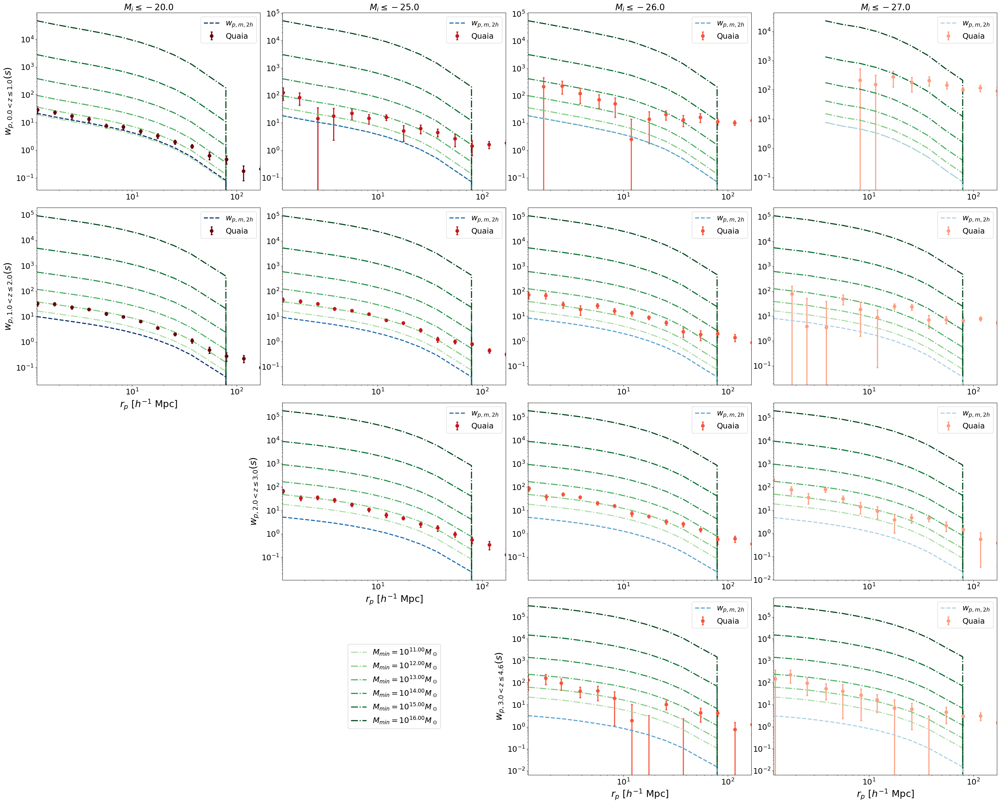

In [69]:
# remove bottom panel and just print bq somewhere
# plot!
fig = plt.figure(figsize = (40, 32))
gs = gridspec.GridSpec(4, 4, wspace = 0.1, hspace = 0.1)
ylims = [[-0.75, 2.5], [-2.5, 12.5], [-12.5, 50], [-75, 375]], [[-0.5, 2.5], [-0.5, 2.5], [-0.5, 7.5], [-2.5, 25]], [[np.nan, np.nan], [-1, 2.75], [-0.75, 5], [-2.5, 10]], [[np.nan, np.nan], [np.nan, np.nan], [-10, 12.5], [-25, 25]]
wp_chi2, wp_matter_chi2, rpavg_chi2 = {L: [] for L in L_bins}, {L: [] for L in L_bins}, {L: [] for L in L_bins}
m = 0
for j in range(len(z_array)):
    
    for i in range(len(L_bins)):

        if ((i<3) and (N_q[L_bins[i]][j]>N_q[L_bins[i+1]][j])) or (i==3):

            ax1 = fig.add_subplot(gs[j*4+i])

            C = np.load('../results/cov_wp_G{}_rmin{}_rmax{}_nbins{}_pimax{}_zmin{}zmax{}_Lmax{}_N{}_{}_MC_mask.npy'.format(G_hi, rmin_log, rmax_log, nbins_log, pimax, z_bins[j], z_bins[j+1], L_bins[i], N_log, cosmo))

            try:
                
                wp_zbin_i = np.load('../results/wp_G{}_rmin{}_rmax{}_nbins{}_pimax{}_zmin{}zmax{}_Lmax{}_{}_MC_mask{}.npy'.format(G_hi, rmin_log, rmax_log, nbins_log, pimax, z_bins[j], z_bins[j+1], L_bins[i], cosmo, mask))
                rpavg_zbin_i = np.load('../results/rpavg_G{}_rmin{}_rmax{}_nbins{}_pimax{}_zmin{}zmax{}_Lmax{}_{}_MC_mask{}.npy'.format(G_hi, rmin_log, rmax_log, nbins_log, pimax, z_bins[j], z_bins[j+1], L_bins[i], cosmo, mask))
                a = float(np.load('../results/a_G{}_zmin{}zmax{}_Lmax{}_{}_MC_mask{}.npy'.format(G_hi, z_bins[j], z_bins[j+1], L_bins[i], cosmo, mask)))

            except:

                tab_datahi_mask_zbin0, tab_randhi_mask_zbin0, key_zbin0, _, _, _, _, _, selfunc_hi_bin0, = quaia.make_bins(G_hi, [j, i], True, ['z', 'L'], 
                                                                                             bins = [z_bins, L_bins], tab_gcat_type = 'data', 
                                                                                              method = ['minmax', 'max'], fac_rand = fac_rand, 
                                                                                              mask = mask*100, percentile = True, n_bins = [None, None])
                
                # quasar correlation function
                wp_zbin_i, rpavg_zbin_i = quaia.wp_rp(tab_datahi_mask_zbin0, tab_randhi_mask_zbin0, key_zbin0, nthreads = nthreads, 
                                                                              rbins = rbins_chi2_log, nbins = nbins_log, pimax = pimax, Om0 = Planck18.Om0, h = Planck18.h)

                # scale factor
                a = a_median(tab_datahi_mask_zbin0)
                
                np.save('../results/wp_G{}_rmin{}_rmax{}_nbins{}_pimax{}_zmin{}zmax{}_Lmax{}_{}_MC_mask{}'.format(G_hi, rmin_log, rmax_log, nbins_log, pimax, z_bins[j], z_bins[j+1], L_bins[i], cosmo, mask), wp_zbin_i)
                np.save('../results/rpavg_G{}_rmin{}_rmax{}_nbins{}_pimax{}_zmin{}zmax{}_Lmax{}_{}_MC_mask{}'.format(G_hi, rmin_log, rmax_log, nbins_log, pimax, z_bins[j], z_bins[j+1], L_bins[i], cosmo, mask), rpavg_zbin_i)
                np.save('../results/a_G{}_zmin{}zmax{}_Lmax{}_{}_MC_mask{}'.format(G_hi, z_bins[j], z_bins[j+1], L_bins[i], cosmo, mask), a)
            

            wp_chi2[L_bins[i]].append(wp_zbin_i)
            rpavg_chi2[L_bins[i]].append(rpavg_zbin_i)

            # matter correlation function   
            s = np.sqrt(np.sum(np.meshgrid(np.array(rpavg_zbin_i)**2, quaia.recenter(pibins)**2), axis = 0))
            s_Mpc = (s*u.Mpc/cu.littleh).to(u.Mpc, cu.with_H0(H0))

            xirppi_zbin_i = ccl.correlations.correlation_3d(cosmo_planck18, r=np.ravel(s_Mpc), a=a)
            wp_matter_zbin_i = 2*np.trapz(np.reshape(xirppi_zbin_i, np.shape(s_Mpc)), quaia.recenter(pibins), axis = 0)
            wp_matter_chi2[L_bins[i]].append(wp_matter_zbin_i)   
            
            ax1.errorbar(rpavg_chi2[L_bins[i]][j], wp_chi2[L_bins[i]][j], linewidth = 2.5, marker = 'o', label = r'Quaia', color = cmap_red[::-1][i],
                        yerr = np.sqrt(np.diag(C)), markeredgewidth = 2.5, capsize = 2.5, linestyle = 'none')
            # if quaia.recenter(rbins_chi2)[0] < 30:
            #     ax1.fill_betweenx(np.linspace(3e-4, 5e1), x1 = quaia.recenter(rbins_chi2)[0], x2 = 30, color = 'grey', 
            #                       alpha = 0.5, label = 'scales excluded from fit')
            #     ax1.fill_betweenx(np.linspace(3e-4, 5e1), x1 = 80, x2 = quaia.recenter(rbins_chi2)[-1], color = 'grey', 
            #                       alpha = 0.5)
            
            # test higher Mmin values
            for k in range(len(Mmins)):
                
                n_m=np.ones(np.shape(bins)) #*10**f_duty[L_bins[i]][j]
                wp_2h_zbin, b_q = wp_2h(np.logspace(Mmins[k],16.8,79), n_m, a_zbin[L_bins[i]][j], cosmo_planck18, wp_matter_chi2[L_bins[i]][j], 
                                        recenter = False)
                ax1.plot(quaia.recenter(rbins_chi2_log), wp_2h_zbin, linewidth = 2.5, linestyle = '-.', color = cmap_green[k]) #,

            if (j == 0) and (i == 3):
                print(wp_2h_zbin)
                    
            # plot matter
            ax1.plot(quaia.recenter(rbins_chi2_log), wp_matter_chi2[L_bins[i]][j], linewidth = 2.5, linestyle = '--',
                     label = r'$w_{{p,m,2h}}$', color = cmap_blue[::-1][i])
        
            if j==0:
                ax1.set_title('$M_i\leq{}$'.format(L_bins[i]))
            ax1.set_xlim(quaia.recenter(rbins_chi2_log)[0], quaia.recenter(rbins_chi2_log)[-1])
            # ax1.set_ylim(ylims[j][i])
            ax1.set_yscale('log')
            ax1.legend()
            ax1.set_xscale('log')
            
            if i==0 or ((j>1) and (i<3) and (i!=j)):
                ax1.set_ylabel(r"$w_{{p,{:.1f}<z \leq{:.1f}}}(s)$".format(z_bins[j], z_bins[j+1]))
            if j > 2 or ((j>0) and (i<2) and (i!=j)):
                ax1.set_xlabel(r'$r_p$ $[h^{-1}$ Mpc]') 
        
        else:
        
            if m == 2:
                ax1 = fig.add_subplot(gs[j*4+i])
                ax1.set_axis_off()
                custom_lines = [Line2D([0], [0], color = cmap_green[i], linestyle = '-.', linewidth = 2.5) for i in range(len(Mmins))]
                second_legend = ax1.legend(custom_lines, [r'$M_{{min}}=10^{{{:.2f}}}M_\odot$'.format(Mmin) for Mmin in Mmins], bbox_to_anchor = (0.5, 0.5), 
                                           loc='center')
                fig.add_artist(second_legend)
            m+=1

plt.show()

# Load G20

In [47]:
G_lo = 20

<>:27: SyntaxWarning: invalid escape sequence '\l'
<>:35: SyntaxWarning: invalid escape sequence '\m'
<>:42: SyntaxWarning: invalid escape sequence '\m'
<>:49: SyntaxWarning: invalid escape sequence '\l'
<>:27: SyntaxWarning: invalid escape sequence '\l'
<>:35: SyntaxWarning: invalid escape sequence '\m'
<>:42: SyntaxWarning: invalid escape sequence '\m'
<>:49: SyntaxWarning: invalid escape sequence '\l'
/tmp/ipykernel_20596/475652251.py:27: SyntaxWarning: invalid escape sequence '\l'
  ax3.hist(tab_datahi_mask_zbin0['M_i'], color = 'white', edgecolor = colors[i], orientation = 'horizontal', bins = np.linspace(-32, -20, 30), alpha = 0.5, label = '$M_i\leq{}$'.format(L_bins[i]))
/tmp/ipykernel_20596/475652251.py:35: SyntaxWarning: invalid escape sequence '\m'
  ax2.set_ylabel('$N_\mathrm{QSO}$')
/tmp/ipykernel_20596/475652251.py:42: SyntaxWarning: invalid escape sequence '\m'
  ax3.set_xlabel('$N_\mathrm{QSO}$')
/tmp/ipykernel_20596/475652251.py:49: SyntaxWarning: invalid escape sequenc

0.7606791583065621
Pixels masked by MC but not already by selfunc: 926
G20.0_zmin0.0zmax1.0_Lmax-20.0: 0.31              138599 vs 200785
0.7572178281423043
Pixels masked by MC but not already by selfunc: 2094
G20.0_zmin1.0zmax2.0_Lmax-20.0: 0.28              264696 vs 369335
0.7346083175107806
Pixels masked by MC but not already by selfunc: 1127
G20.0_zmin2.0zmax3.0_Lmax-20.0: 0.26              122259 vs 165277
0.862919347799225
Pixels masked by MC but not already by selfunc: 78
G20.0_zmin3.0zmax4.6_Lmax-20.0: 0.22              15923 vs 20451
0.7677528469026641
Pixels masked by MC but not already by selfunc: 493
G20.0_zmin0.0zmax1.0_Lmax-25.0: 0.39              31793 vs 51805
0.8262410502712552
Pixels masked by MC but not already by selfunc: 1963
G20.0_zmin1.0zmax2.0_Lmax-25.0: 0.30              240471 vs 343295
0.7346083175107806
Pixels masked by MC but not already by selfunc: 1127
G20.0_zmin2.0zmax3.0_Lmax-25.0: 0.26              122259 vs 165277
0.862919347799225
Pixels masked by M

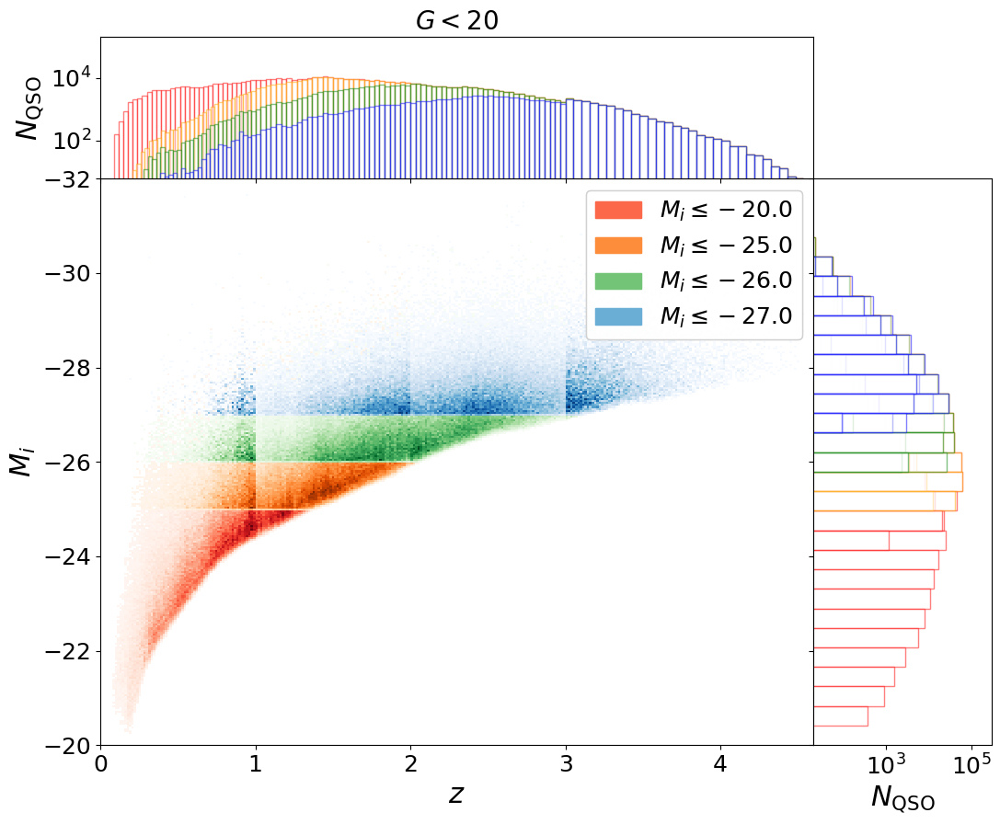

In [48]:
# plot!
fig = plt.figure(figsize = (12.5, 10))
gs = gridspec.GridSpec(2, 2, hspace = 0, height_ratios=[1,4], width_ratios=[4,1], wspace = 0)
fac_rand = 25

ax1 = fig.add_subplot(gs[2])
ax2 = fig.add_subplot(gs[0])
ax3 = fig.add_subplot(gs[3])

N_q = {L: [] for L in L_bins}

for i in range(len(L_bins)):
        
    for j in z_array:
        
        tab_datahi_mask_zbin0, tab_randhi_mask_zbin0, key_zbin0, _, _, _, _, _, _ = quaia.make_bins(G_lo, [j, i], True, ['z', 'L'], 
                                                                                             bins = [z_bins, L_bins], tab_gcat_type = 'data', 
                                                                                              method = ['minmax', 'max'], fac_rand = fac_rand, 
                                                                                              mask = mask*100, percentile = True, n_bins = [None, None])
        quaia.absolute(tab_datahi_mask_zbin0, G_lo)
        h1, xedges, yedges, image = ax1.hist2d(tab_datahi_mask_zbin0['redshift_quaia'], tab_datahi_mask_zbin0['M_i'],
                                               cmap = plt.get_cmap('{}s'.format(colors[i])), bins = [np.linspace(0, 4.6, 300), np.linspace(-32, -20, 300)],
                                               cmin = 1)
        xlim = ax1.get_xlim()

        ax2.hist(tab_datahi_mask_zbin0['redshift_quaia'], color = 'white', edgecolor = colors[i], bins = 30, alpha = 0.5)
        ax3.hist(tab_datahi_mask_zbin0['M_i'], color = 'white', edgecolor = colors[i], orientation = 'horizontal', bins = np.linspace(-32, -20, 30), alpha = 0.5, label = '$M_i\leq{}$'.format(L_bins[i]))
        
        N_q[L_bins[i]].append(len(tab_datahi_mask_zbin0))
    
ax1.set_ylabel('$M_i$')
ax1.set_xlabel('$z$')
ax1.set_ylim(-20, -32)

ax2.set_ylabel('$N_\mathrm{QSO}$')
ax2.set_yscale('log')
ax2.set_xlim(xlim)
ax2.set_ylim(6,2e5)
ax2.set_xticklabels([])
ax2.set_title('$G<{}$'.format(G_lo))

ax3.set_xlabel('$N_\mathrm{QSO}$')
ax3.set_xscale('log')
ax3.set_yticklabels([])
ax3.set_ylim(-20, -32)
ax3.set_xlim(2e1,3e5)

custom_lines = [mpatches.Patch(color=plt.get_cmap('{}s'.format(colors[i]))(np.array(0.5))) for i in range(len(L_bins))]
second_legend = ax1.legend(custom_lines, ['$M_i\leq{}$'.format(L) for L in L_bins])
fig.add_artist(second_legend)

plt.show()

In [49]:
tab_datahi_mask_zbin0, tab_randhi_mask_zbin0, key_zbin0, _, _, _, _, _, _ = quaia.make_bins(G_lo, 0, True, 'z', 
                                                                                             bins = [0,4.6], tab_gcat_type = 'data', fac_rand = fac_rand, 
                                                                                              mask = mask*100, percentile = True, n_bins = None)

Leaving tab_gcat_catalog unbinned
0.7194458197343285
Pixels masked by MC but not already by selfunc: 4231
G20.0: 0.28              541420 vs 755850


In [50]:
quaia.absolute(tab_datahi_mask_zbin0, G_lo)

array([14059.89879616, 10102.60285244, 14612.75678367, ...,
       31285.56565415,  8835.65755401, 20128.83921923])

<>:29: SyntaxWarning: invalid escape sequence '\m'
<>:37: SyntaxWarning: invalid escape sequence '\m'
<>:29: SyntaxWarning: invalid escape sequence '\m'
<>:37: SyntaxWarning: invalid escape sequence '\m'
/tmp/ipykernel_20596/2127205833.py:29: SyntaxWarning: invalid escape sequence '\m'
  ax2_hi.set_ylabel('N$_\mathrm{QSO}$')
/tmp/ipykernel_20596/2127205833.py:37: SyntaxWarning: invalid escape sequence '\m'
  ax3_hi.set_xlabel('N$_\mathrm{QSO}$')


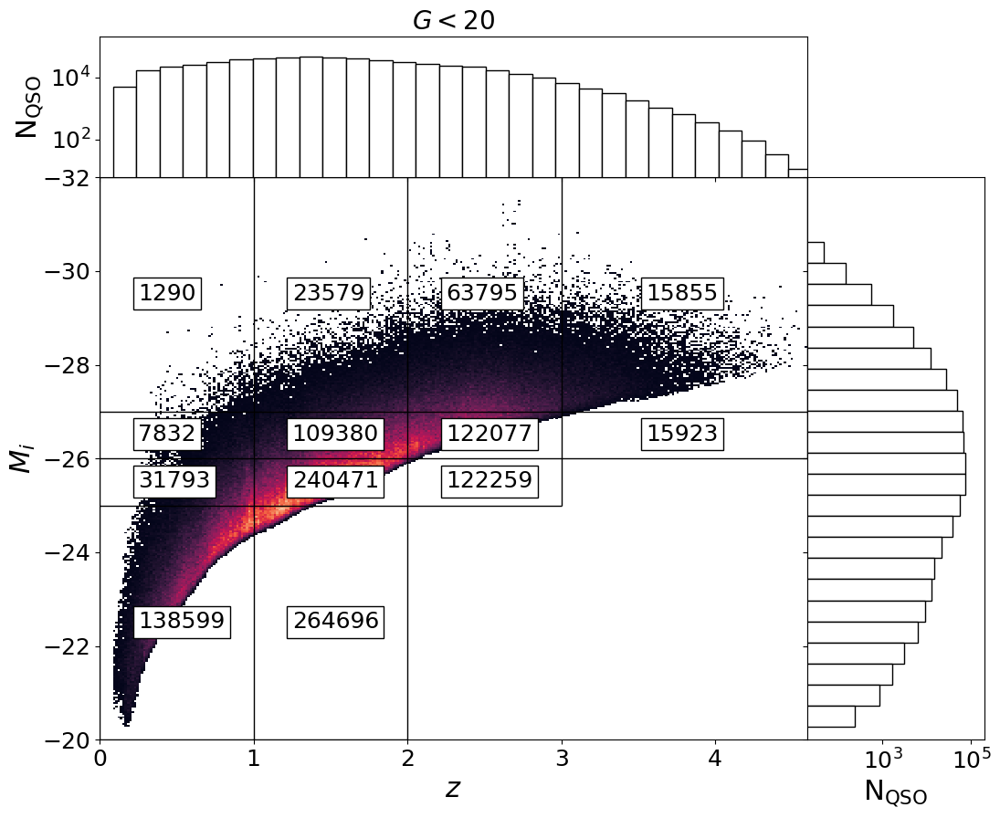

In [52]:
# plot!
fig = plt.figure(figsize = (12.5, 10))
gs = gridspec.GridSpec(2, 2, hspace = 0, height_ratios=[1,4], width_ratios=[4,1], wspace = 0)

ax1_hi = fig.add_subplot(gs[2])

h1, xedges, yedges, image = ax1_hi.hist2d(tab_datahi_mask_zbin0['redshift_quaia'], tab_datahi_mask_zbin0['M_i'], cmap = cmap_rocket, bins = 300, 
                                       cmin = 1)

for L_bin, xmax in zip(L_array, [z_bins[2], z_bins[3], z_bins[4], z_bins[4], z_bins[4]]):
    ax1_hi.hlines(L_bin, color = 'black', xmin = z_bins[0], xmax = xmax, linewidth = 1)
for z_bin, ymax in zip(z_bins, [L_bins[0], L_bins[0], L_bins[0], L_bins[1], L_bins[2]]):
    ax1_hi.vlines(z_bin, color = 'black', ymin = -32, ymax = ymax, linewidth = 1)
    
for i in z_array:
    for j in range(len(L_bins)):
        if ((j<3) and (N_q[L_bins[j]][i]>N_q[L_bins[j+1]][i])) or (j ==3):
            ax1_hi.text(quaia.recenter(z_bins)[i]-0.25, quaia.recenter(L_array)[j]+0.125, N_q[L_bins[j]][i], fontsize = 18, color = 'black', bbox=dict(facecolor='white'))
            
ax1_hi.set_ylabel('$M_i$')
xlim = ax1.get_xlim()
ax1_hi.set_xlabel('$z$')
ax1_hi.set_ylim(-20, -32)
ax1_hi.set_xlim(xlim[0], z_bins[-1])

ax2_hi = fig.add_subplot(gs[0])
ax2_hi.hist(tab_datahi_mask_zbin0['redshift_quaia'], color = 'white', edgecolor = 'black', bins = 30)
ax2_hi.set_title('$G<{}$'.format(G_lo))
ax2_hi.set_ylabel('N$_\mathrm{QSO}$')
ax2_hi.set_yscale('log')
ax2_hi.set_xlim(xlim[0], z_bins[-1])
ax2_hi.set_ylim(6,2e5)
ax2_hi.set_xticklabels([])

ax3_hi = fig.add_subplot(gs[3])
ax3_hi.hist(tab_datahi_mask_zbin0['M_i'], color = 'white', edgecolor = 'black', orientation = 'horizontal', bins = 25)
ax3_hi.set_xlabel('N$_\mathrm{QSO}$')
ax3_hi.set_xscale('log')
ax3_hi.set_yticklabels([])
ax3_hi.set_ylim(-20, -32)
ax3_hi.set_xlim(2e1,2e5)

plt.show()

## Plot correlation matrix

<>:23: SyntaxWarning: invalid escape sequence '\l'
<>:26: SyntaxWarning: invalid escape sequence '\l'
<>:23: SyntaxWarning: invalid escape sequence '\l'
<>:26: SyntaxWarning: invalid escape sequence '\l'
/tmp/ipykernel_20596/2447837386.py:23: SyntaxWarning: invalid escape sequence '\l'
  ax1.set_ylabel('$r_{{p,{:.1f}<z \leq{:.1f}}} (h^{{-1}}$ Mpc)'.format(z_bins[i], z_bins[i+1]))
/tmp/ipykernel_20596/2447837386.py:26: SyntaxWarning: invalid escape sequence '\l'
  ax1.set_title('$M_i\leq{}$'.format(L_bins[j]))


(-1.0, 1.0)
(-1.0, 1.0)
(-1.0, 1.0)
(-1.0, 1.0)
(-1.0, 1.0)
(-1.0, 1.0)
(-1.0, 1.0)
(-1.0, 1.0)
(-1.0, 1.0)
(-1.0, 1.0)
(-1.0, 1.0)
(-1.0, 1.0)
(-1.0, 1.0)
(-1.0, 1.0)
(-1.0, 1.0)
(-1.0, 1.0)


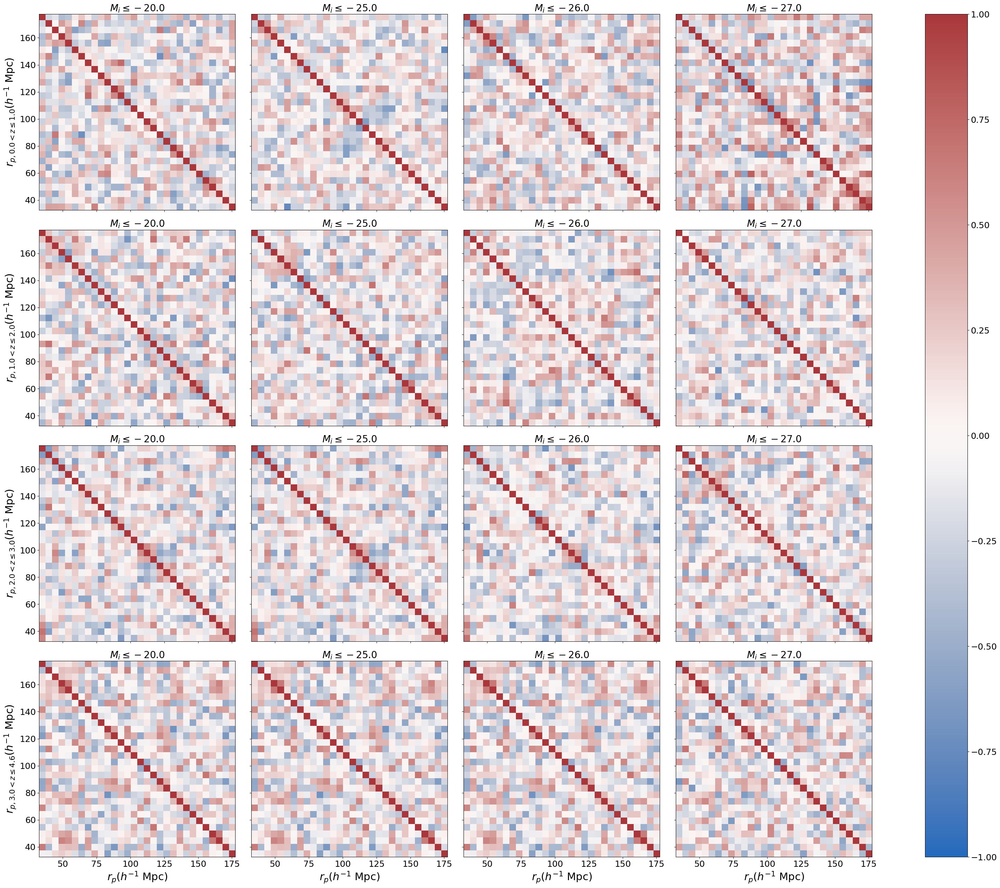

In [53]:
cmap = sns.color_palette("vlag", as_cmap=True)
r = quaia.recenter(rbins_chi2) #_chi2)

# plot!
fig = plt.figure(figsize = (40, 32))
gs = gridspec.GridSpec(4, 4, wspace = 0, hspace = 0.1)
axes = []
for i in range(len(z_bins)-1):
    
    for j in range(len(L_bins)):
    
        ax1 = fig.add_subplot(gs[i*4+j])

        C = np.load('../results/cov_wp_G{:.1f}_rmin{}_rmax{}_nbins{}_pimax{}_zmin{}zmax{}_Lmax{}_N{}_{}_MC_mask.npy'.format(G_lo, rmin, rmax, nbins, pimax, z_bins[i], z_bins[i+1], L_bins[j], N, cosmo))
        matrix = np.corrcoef(C)
        image = ax1.imshow(matrix, cmap = cmap, extent = [r[0], r[-1], r[0], r[-1]], vmin = -1, vmax = 1)
        print(image.get_clim())
        if i > 2:
            ax1.set_xlabel('$r_p (h^{-1}$ Mpc)')
        else:
            ax1.set_xticklabels([])
        if j == 0:
            ax1.set_ylabel('$r_{{p,{:.1f}<z \leq{:.1f}}} (h^{{-1}}$ Mpc)'.format(z_bins[i], z_bins[i+1]))
        else:
            ax1.set_yticklabels([])
        ax1.set_title('$M_i\leq{}$'.format(L_bins[j]))
        axes.append(ax1)
    
fig.colorbar(image, ax = axes)
plt.show()

# Calculate derived parameters

<>:19: SyntaxWarning: invalid escape sequence '\l'
<>:82: SyntaxWarning: invalid escape sequence '\m'
<>:19: SyntaxWarning: invalid escape sequence '\l'
<>:82: SyntaxWarning: invalid escape sequence '\m'
/tmp/ipykernel_20596/807909714.py:19: SyntaxWarning: invalid escape sequence '\l'
  ax1.set_title('$M_i\leq{}$'.format(L_bins[i]))
/tmp/ipykernel_20596/807909714.py:82: SyntaxWarning: invalid escape sequence '\m'
  ax1.errorbar(rpavg_zbin_i, wp_zbin_i, marker = 'o', label = '${:.0f}^\mathrm{{th}}$ percentile'.format(mask*100), markeredgewidth = 2.5, capsize = 2.5,


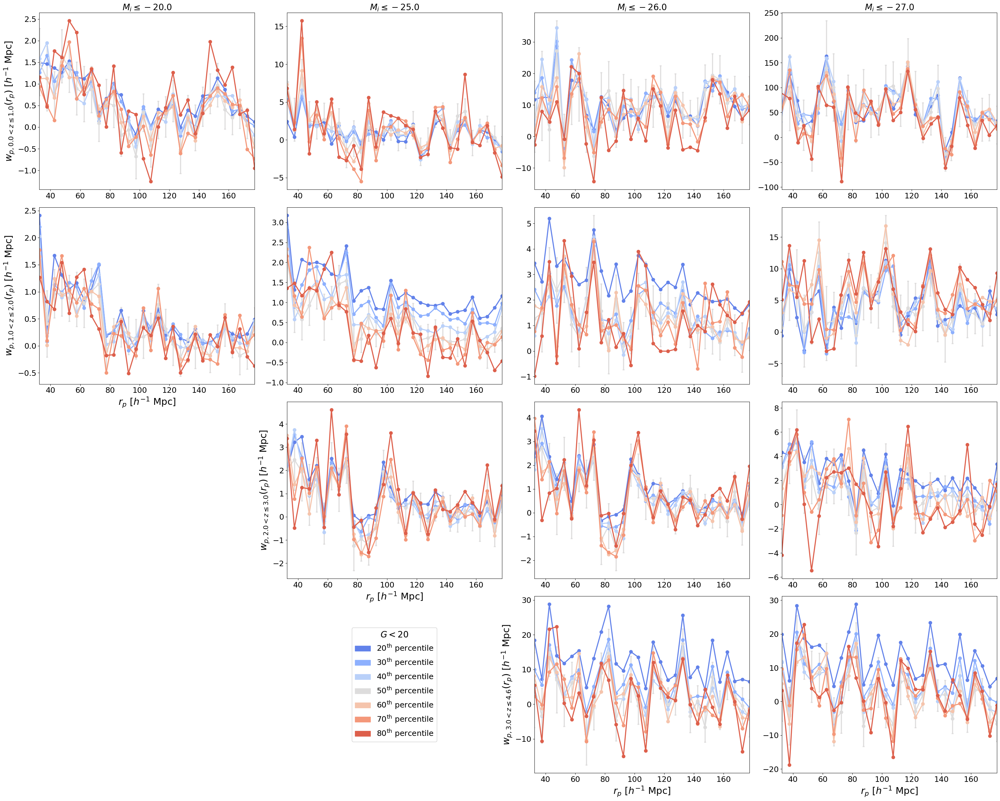

In [59]:
r = quaia.recenter(rbins_chi2) #_chi2)
wp_chi2, wp_matter_chi2, rpavg_chi2 = {L: [] for L in L_bins}, {L: [] for L in L_bins}, {L: [] for L in L_bins}
a_zbin = {L: [] for L in L_bins}

fig = plt.figure(figsize = (40, 32))
gs = gridspec.GridSpec(4, 4, wspace = 0.15, hspace = 0.1)

H0 = Planck18.H0 # cosmo_planck18['H0'] * u.km/u.s/u.Mpc

for j in z_array:
    
    for i in range(len(L_bins)):

        if ((i<3) and (N_q[L_bins[i]][j]>N_q[L_bins[i+1]][j])) or (i==3):
                
            ax1 = fig.add_subplot(gs[j*4+i])

            if j ==0:
                ax1.set_title('$M_i\leq{}$'.format(L_bins[i]))
            if scale == 'log':
                ax1.set_xscale('log')
            ax1.set_xlim(r[0], r[-1])
            
            if j > 2 or ((j>0) and (i <2) and (i!=j)):
                ax1.set_xlabel(r'$r_p$ $[h^{-1}$ Mpc]') # projected
            if i==0 or ((j>1) and (i <3) and (i!=j)):
                ax1.set_ylabel(r"$w_{{p,{:.1f}<z \leq{:.1f}}}(r_p)$ $[h^{{-1}}$ Mpc]".format(z_bins[j], z_bins[j+1]))
        else:

            ax2 = fig.add_subplot(gs[j*4+i])
            ax2.set_axis_off()
                
        for k in range(len(masks)):
                    
            try:
                
                wp_zbin_i = np.load('../results/wp_G{:.1f}_rmin{}_rmax{}_nbins{}_pimax{}_zmin{}zmax{}_Lmax{}_{}_MC_mask{}.npy'.format(G_lo, rmin, rmax, nbins, pimax, z_bins[j], z_bins[j+1], L_bins[i], cosmo, masks[k]))
                rpavg_zbin_i = np.load('../results/rpavg_G{:.1f}_rmin{}_rmax{}_nbins{}_pimax{}_zmin{}zmax{}_Lmax{}_{}_MC_mask{}.npy'.format(G_lo, rmin, rmax, nbins, pimax, z_bins[j], z_bins[j+1], L_bins[i], cosmo, masks[k]))
                a = float(np.load('../results/a_G{:.1f}_zmin{}zmax{}_Lmax{}_{}_MC_mask{}.npy'.format(G_lo, z_bins[j], z_bins[j+1], L_bins[i], cosmo, masks[k])))

            except:

                tab_datahi_mask_zbin0, tab_randhi_mask_zbin0, key_zbin0, _, _, _, _, _, selfunc_hi_bin0, = quaia.make_bins(G_lo, [j, i], True, ['z', 'L'], 
                                                                                             bins = [z_bins, L_bins], tab_gcat_type = 'data', 
                                                                                              method = ['minmax', 'max'], fac_rand = fac_rand, 
                                                                                              mask = masks[k]*100, percentile = True, n_bins = [None, None])
                
                # quasar correlation function
                wp_zbin_i, rpavg_zbin_i = quaia.wp_rp(tab_datahi_mask_zbin0, tab_randhi_mask_zbin0, key_zbin0, nthreads = nthreads, 
                                                                              rbins = rbins_chi2, nbins = nbins, pimax = pimax, Om0 = Planck18.Om0, h = Planck18.h)

                # scale factor
                a = a_median(tab_datahi_mask_zbin0)
                
                np.save('../results/wp_G{:.1f}_rmin{}_rmax{}_nbins{}_pimax{}_zmin{}zmax{}_Lmax{}_{}_MC_mask{}'.format(G_lo, rmin, rmax, nbins, pimax, z_bins[j], z_bins[j+1], L_bins[i], cosmo, masks[k]), wp_zbin_i)
                np.save('../results/rpavg_G{:.1f}_rmin{}_rmax{}_nbins{}_pimax{}_zmin{}zmax{}_Lmax{}_{}_MC_mask{}'.format(G_lo, rmin, rmax, nbins, pimax, z_bins[j], z_bins[j+1], L_bins[i], cosmo, masks[k]), rpavg_zbin_i)
                np.save('../results/a_G{:.1f}_zmin{}zmax{}_Lmax{}_{}_MC_mask{}'.format(G_lo, z_bins[j], z_bins[j+1], L_bins[i], cosmo, masks[k]), a)
            
            if masks[k] == 0.5:
                
                sigma = np.sqrt(np.diag(np.load('../results/cov_wp_G{:.1f}_rmin{}_rmax{}_nbins{}_pimax{}_zmin{}zmax{}_Lmax{}_N{}_{}_MC_mask.npy'.format(G_lo, rmin, rmax, nbins, pimax, z_bins[j], z_bins[j+1], L_bins[i], N, cosmo))))

                wp_chi2[L_bins[i]].append(wp_zbin_i)
                rpavg_chi2[L_bins[i]].append(rpavg_zbin_i)
                a_zbin[L_bins[i]].append(a)

                # matter correlation function   
                s = np.sqrt(np.sum(np.meshgrid(np.array(rpavg_zbin_i)**2, quaia.recenter(pibins)**2), axis = 0))
                s_Mpc = (s*u.Mpc/cu.littleh).to(u.Mpc, cu.with_H0(H0))

                xirppi_zbin_i = ccl.correlations.correlation_3d(cosmo_planck18, r=np.ravel(s_Mpc), a=a)
                wp_matter_zbin_i = 2*np.trapz(np.reshape(xirppi_zbin_i, np.shape(s_Mpc)), quaia.recenter(pibins), axis = 0)
                wp_matter_chi2[L_bins[i]].append(wp_matter_zbin_i)   
            
            else: 
                sigma = 0

            # plot!

            if ((i<3) and (N_q[L_bins[i]][j]>N_q[L_bins[i+1]][j])) or (i==3):
                    
                ax1.errorbar(rpavg_zbin_i, wp_zbin_i, marker = 'o', label = '${:.0f}^\mathrm{{th}}$ percentile'.format(mask*100), markeredgewidth = 2.5, capsize = 2.5,
                         linewidth = 2.5, color = cmap_masks[k], yerr = sigma, linestyle = '-')

                
custom_lines = [mpatches.Patch(color=cmap_masks[i]) for i in range(len(masks))]
first_legend = ax2.legend(custom_lines, [r'${:.0f}^\mathrm{{th}}$ percentile'.format(mask*100) for mask in masks], loc = 'center', title = r'$G<{}$'.format(G_lo), title_fontsize = 20)
fig.add_artist(first_legend)

plt.show()

### Test $M_{min}$

<>:51: SyntaxWarning: invalid escape sequence '\l'
<>:51: SyntaxWarning: invalid escape sequence '\l'
/tmp/ipykernel_20596/1121689245.py:51: SyntaxWarning: invalid escape sequence '\l'
  ax1.set_title('$M_i\leq{}$'.format(L_bins[i]))


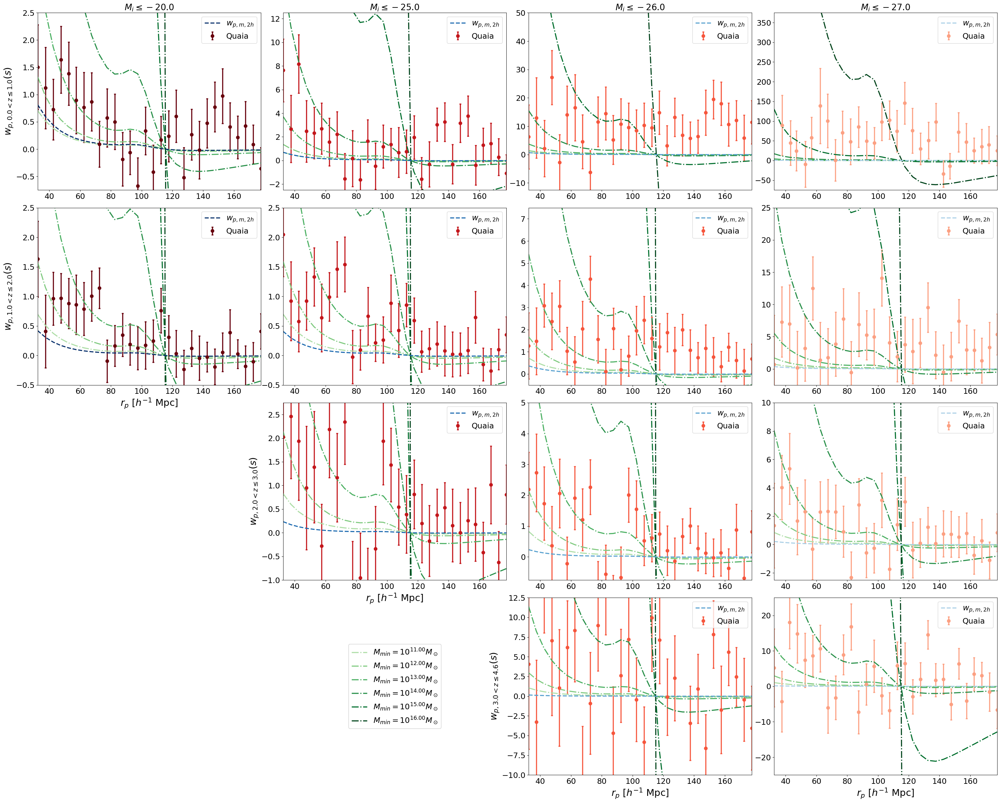

In [55]:
# remove bottom panel and just print bq somewhere
# plot!
fig = plt.figure(figsize = (40, 32))
gs = gridspec.GridSpec(4, 4, wspace = 0.1, hspace = 0.1)
ylims = [[-0.75, 2.5], [-2.5, 12.5], [-12.5, 50], [-75, 375]], [[-0.5, 2.5], [-0.5, 2.5], [-0.5, 7.5], [-2.5, 25]], [[np.nan, np.nan], [-1, 2.75], [-0.75, 5], [-2.5, 10]], [[np.nan, np.nan], [np.nan, np.nan], [-10, 12.5], [-25, 25]]
m = 0
for j in range(len(z_array)):
    
    for i in range(len(L_bins)):

        if ((i<3) and (N_q[L_bins[i]][j]>N_q[L_bins[i+1]][j])) or (i==3):

            ax1 = fig.add_subplot(gs[j*4+i])

            C = np.load('../results/cov_wp_G{:.1f}_rmin{}_rmax{}_nbins{}_pimax{}_zmin{}zmax{}_Lmax{}_N{}_{}_MC_mask.npy'.format(G_lo, rmin, rmax, nbins, pimax, z_bins[j], z_bins[j+1], L_bins[i], N, cosmo))
                   
            ax1.errorbar(rpavg_chi2[L_bins[i]][j], wp_chi2[L_bins[i]][j], linewidth = 2.5, marker = 'o', label = r'Quaia', color = cmap_red[::-1][i],
                        yerr = np.sqrt(np.diag(C)), markeredgewidth = 2.5, capsize = 2.5, linestyle = 'none')
            if quaia.recenter(rbins_chi2)[0] < 30:
                ax1.fill_betweenx(np.linspace(3e-4, 5e1), x1 = quaia.recenter(rbins_chi2)[0], x2 = 30, color = 'grey', 
                                  alpha = 0.5, label = 'scales excluded from fit')
                ax1.fill_betweenx(np.linspace(3e-4, 5e1), x1 = 80, x2 = quaia.recenter(rbins_chi2)[-1], color = 'grey', 
                                  alpha = 0.5)
        
            # wp_2h_samples = []
            # for l in range(len(ind)):
            #     n_m=np.ones(np.shape(bins))*f_duty_samples[L_bins[i]][j][l]
            #     wp_2h_sample, _ = wp_2h(np.logspace(M_min_samples[L_bins[i]][j][l],M_max,79), n_m, a_zbin[L_bins[i]][j], cosmo_planck18, 
            #                             wp_matter_chi2[L_bins[i]][j], recenter = False)
            #     wp_2h_samples.append(wp_2h_sample)
            # wp_2h_16, wp_2h_50, wp_2h_84 = np.percentile(wp_2h_samples, [16, 50, 84], axis=0)
            # ax1.plot(quaia.recenter(rbins_chi2), wp_2h_50, linewidth = 2.5,
            #          label = r'$w_{{p,q,2h}}(f_{{duty}}=10^{{{:.2f}}}, M_{{min}}=10^{{{:.2f}}}M_\odot)$'.format(f_duty[L_bins[i]][j], 
            #                                                                                                     M_min[L_bins[i]][j]), 
            #          color = cmap_blue[::-1][i])
            # ax1.fill_between(quaia.recenter(rbins_chi2), wp_2h_16, wp_2h_84, linewidth = 2.5, alpha = 0.5,
            #          color = cmap_blue[::-1][i])  
            
            # test higher Mmin values
            for k in range(len(Mmins)):
                n_m=np.ones(np.shape(bins)) #*10**f_duty[L_bins[i]][j]
                wp_2h_zbin, b_q = wp_2h(np.logspace(Mmins[k],16.8,79), n_m, a_zbin[L_bins[i]][j], cosmo_planck18, wp_matter_chi2[L_bins[i]][j], 
                                        recenter = False)
                ax1.plot(quaia.recenter(rbins_chi2), wp_2h_zbin, linewidth = 2.5, linestyle = '-.', color = cmap_green[k]) #,
                    
            # plot matter
            ax1.plot(quaia.recenter(rbins_chi2), wp_matter_chi2[L_bins[i]][j], linewidth = 2.5, linestyle = '--',
                     label = r'$w_{{p,m,2h}}$', color = cmap_blue[::-1][i])
        
            if j==0:
                ax1.set_title('$M_i\leq{}$'.format(L_bins[i]))
            ax1.set_xlim(quaia.recenter(rbins_chi2)[0], quaia.recenter(rbins_chi2)[-1])
            ax1.set_ylim(ylims[j][i])
            ax1.legend()
            
            if i==0 or ((j>1) and (i<3) and (i!=j)):
                ax1.set_ylabel(r"$w_{{p,{:.1f}<z \leq{:.1f}}}(s)$".format(z_bins[j], z_bins[j+1]))
            if j > 2 or ((j>0) and (i<2) and (i!=j)):
                ax1.set_xlabel(r'$r_p$ $[h^{-1}$ Mpc]') 
        
        else:
        
            if m == 2:
                ax1 = fig.add_subplot(gs[j*4+i])
                ax1.set_axis_off()
                custom_lines = [Line2D([0], [0], color = cmap_green[i], linestyle = '-.', linewidth = 2.5) for i in range(len(Mmins))]
                second_legend = ax1.legend(custom_lines, [r'$M_{{min}}=10^{{{:.2f}}}M_\odot$'.format(Mmin) for Mmin in Mmins], bbox_to_anchor = (0.5, 0.5), 
                                           loc='center')
                fig.add_artist(second_legend)
            m+=1

plt.show()